In [1]:
from functions import *
from VAE import VariationalAutoEncoder, calc_kl, calc_reconstruction_loss
from sklearn.decomposition import PCA
from MLP import MLP
from OODBoost import OODModel
from metrics import extended_confusion_matrix, ClassificationComparison

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sbo import soft_brownian_offset

import math
import pandas as pd
import numpy as np
import seaborn as sns
import random
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from mpl_toolkits.axes_grid1 import make_axes_locatable

from tqdm import tqdm
import optuna
import optuna.visualization as vis
import logging
optuna_logger = logging.getLogger("optuna")
optuna_logger.setLevel(logging.CRITICAL)  # Only critical messages (practically no logs)

import torch
from torch import Tensor, tensor
from torch.nn.functional import mse_loss
from torch.utils.data import DataLoader, TensorDataset
from ood_score import get_ood_score, get_ood_score_boost, highlight_ood_metrics
from detection_methods_posthoc import detection_method

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
from sklearn.base import clone

import os

def set_random_seed(seed=0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)  # Set seed for CPU
    torch.cuda.manual_seed(seed)  # Set seed for GPU (if using CUDA)
    torch.cuda.manual_seed_all(seed)  # Set seed for all GPUs
    np.random.seed(seed)  # Set seed for NumPy
    random.seed(seed)  # Set seed for Python random
    torch.backends.cudnn.deterministic = True  # Ensure deterministic behavior
    torch.backends.cudnn.benchmark = False  # Disable benchmark for reproducibility

# Standard vs MinMax

In [2]:
name_dict = {
    "xgbclassifier": "XGB",
    "lgbmclassifier": "LGB",
    "catboostclassifier": "CB"
}

## Shear Wall

In [120]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Shear_Wall_Database.xlsx'
problem_name = "_SW"
df1 = pd.read_excel(file_path, sheet_name='Database')
df=df1.loc[:, 'FailureMode':'Ab/Ag']
df.head()

,FailureMode,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,hw/fc","ρvbFy,vb/fc","ρhbFy,hb/fc",P/fcAg,Section,Ab/Ag
0,1,1.1,10.714286,0.268879,0.136711,0.348231,0.149140,0.000000,R,0.0
1,1,1.1,10.714286,0.262358,0.133396,0.339785,0.145522,0.102168,R,0.0
2,1,1.1,10.714286,0.346364,0.176108,0.448584,0.192118,0.208187,R,0.0
3,1,1.1,10.714286,0.334023,0.169834,0.432601,0.185273,0.000000,R,0.0
4,1,1.1,10.714286,0.324766,0.165127,0.420612,0.180139,0.101727,R,0.0


In [121]:
X=df.loc[:, df.columns != 'FailureMode']
y=df['FailureMode']
class_names = ["F", "FS", "S", "SL"]

In [122]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')
# split data into train and test
id_feature = np.array(processed_df)
id_label = np.array(y) - 1
num_classes = len(np.unique(id_label))

X_train, X_test, y_train, y_test = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)
test = ClassificationComparison(y_test)
name="Standard_"

model = XGBClassifier(random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test.calculate_metrics(y_pred, name+model_name)

model = LGBMClassifier(random_state=0, verbose=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test.calculate_metrics(y_pred, name + model_name)

model = CatBoostClassifier(verbose=0, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test.calculate_metrics(y_pred, name + model_name)

In [123]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'minmax')
# split data into train and test
id_feature = np.array(processed_df)
id_label = np.array(y) - 1
num_classes = len(np.unique(id_label))

X_train, X_test, y_train, y_test = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)
name="MinMax_"

model = XGBClassifier(random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test.calculate_metrics(y_pred, name+model_name)

model = LGBMClassifier(random_state=0, verbose=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test.calculate_metrics(y_pred, name + model_name)

model = CatBoostClassifier(verbose=0, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test.calculate_metrics(y_pred, name + model_name)

In [124]:
# Create DataFrame with MultiIndex
data = test.metrics

df = pd.DataFrame(data)
df[['Normalization', 'Model']] = df['Method'].str.split('_', expand=True)
df.drop(columns='Method', inplace=True)

# Step 2: Set MultiIndex on rows
df.set_index(['Model', 'Normalization'], inplace=True)
df.sort_index(level='Model', inplace=True)

In [125]:
def style_df(df):
    styler = df.style.format("{:.2f}")

    for metric in ['Macro Precision', 'Macro Recall', 'Macro F1-Score', 'Accuracy']:
        # Highlight max per Model (i.e. within each method group)
        styler = styler.highlight_max(
            subset=pd.IndexSlice[:, metric],
            axis=0,
            props='font-weight: bold; color: black;'
        )
    return styler

display(style_df(df))

## Bridge Dataset

In [126]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Bridge dataset.xlsx'
problem_name = "_BT"
df2 = pd.read_excel(file_path)
df2.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X13,X14,X15,X16,X17,X18,X19,X20,X21,Y
0,44.971492,18.247541,30.693913,469.086924,7.915522,0.025351,422.815998,0.816587,1.295880,5.444734,...,1.087264,0.054622,2,0.170517,0.442484,0.241954,10.774654,3.590439,1.097036,0
1,60.140854,17.809083,37.264213,533.616655,6.486088,0.016072,179.523813,3.269385,0.786103,3.846675,...,1.019205,0.061542,1,0.427709,0.312937,0.164976,10.815358,0.783233,0.990123,2
2,30.571931,17.386377,26.834816,431.185078,8.323085,0.027038,128.194101,0.934619,1.124079,3.827775,...,1.021480,0.035817,2,0.444432,1.134343,0.451155,42.870555,35.281881,0.913632,1
3,41.408870,17.433227,25.659810,419.644842,8.219384,0.026661,368.343563,2.672667,1.095994,3.582685,...,1.061265,0.042044,1,0.362607,0.845263,0.385786,15.821361,11.135341,1.195794,2
4,53.444701,19.729893,31.284727,474.889567,6.246412,0.014537,83.140438,2.835088,0.789106,4.051574,...,0.992220,0.049227,2,0.362776,0.810758,0.376524,18.078815,14.848802,1.089014,2


In [127]:
col = ['X12','X15']
df2[col] = df2[col].astype(str)

X=df2.loc[:, df2.columns != 'Y']
y=df2['Y']
class_names = ["G", "Y", "R"]

In [128]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')
# split data into train and test
id_feature = np.array(processed_df)
id_label = np.array(y)
num_classes = len(np.unique(id_label))

X_train, X_test, y_train, y_test = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)
test2 = ClassificationComparison(y_test)
name="Standard_"

model = XGBClassifier(random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test2.calculate_metrics(y_pred, name+model_name)

model = LGBMClassifier(random_state=0, verbose=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test2.calculate_metrics(y_pred, name + model_name)

model = CatBoostClassifier(verbose=0, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test2.calculate_metrics(y_pred, name + model_name)

In [129]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'minmax')
# split data into train and test
id_feature = np.array(processed_df)
id_label = np.array(y)

X_train, X_test, y_train, y_test = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)
name="MinMax_"

model = XGBClassifier(random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test2.calculate_metrics(y_pred, name+model_name)

model = LGBMClassifier(random_state=0, verbose=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test2.calculate_metrics(y_pred, name + model_name)

model = CatBoostClassifier(verbose=0, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model_name = name_dict[model.__class__.__name__.lower()]
test2.calculate_metrics(y_pred, name + model_name)

In [130]:
# Create DataFrame with MultiIndex
data2 = test2.metrics
df2 = pd.DataFrame(data2)
df2[['Normalization', 'Model']] = df2['Method'].str.split('_', expand=True)
df2.drop(columns='Method', inplace=True)
df2.set_index(['Model', 'Normalization'], inplace=True)
df2.sort_index(level='Model', inplace=True)

df.columns = pd.MultiIndex.from_product([['Shear Wall'], df.columns])
df2.columns = pd.MultiIndex.from_product([['Bridge'], df2.columns])
df_combined = pd.concat([df, df2], axis=1)

In [132]:
def style_df(df):
    styler = df.style.format("{:.2f}")

    for dataset in df.columns.levels[0]:  # e.g., 'Shear Wall', 'Bridge'
        for metric in ['Macro Precision', 'Macro Recall', 'Macro F1-Score', 'Accuracy']:
            if (dataset, metric) in df.columns:
                styler = styler.highlight_max(
                    subset=pd.IndexSlice[:, (dataset, metric)],
                    axis=0,
                    props='font-weight: bold; color: black;'
                )
    
    # Center column headers (including MultiIndex)
    styler.set_table_styles([
        {'selector': 'th', 'props': [('text-align', 'center')]},
    ], overwrite=False)

    # Center row index
    styler.set_properties(**{'text-align': 'center'}, subset=pd.IndexSlice[:, :])
    return styler

display(style_df(df_combined))

# Beta Comparison

In [60]:
import matplotlib.pyplot as plt
import numpy as np
import math

def mean_std(x):
    x_np = x.detach().cpu().numpy()
    return f"{x_np.mean():.2f}±{x_np.std():.2f}"

def plot_latents_with_losses(betas, latents_list, rec_losses, kl_losses, point_size=20, max_cols=2, name=None):
    n = len(latents_list)
    cols = min(n, max_cols)
    rows = math.ceil(n / cols)

    fig = plt.figure(figsize=(6 * cols, 6 * rows))

    for i in range(n):
        ax = fig.add_subplot(rows, cols, i + 1, projection='3d')

        latent = latents_list[i]
        xs, ys, zs = latent[:, 0], latent[:, 1], latent[:, 2]
        ax.scatter(xs, ys, zs, s=point_size, alpha=0.7)

        ax.set_xlabel(f'Latent 1\n({mean_std(xs)})')
        ax.set_ylabel(f'Latent 2\n({mean_std(ys)})')
        ax.set_zlabel(f'Latent 3\n({mean_std(zs)})')

        ax.set_title(f'β={betas[i]}')

        rec_str = f"Rec Loss: {rec_losses[i]:.4f}"
        kl_str = f"KL Loss: {kl_losses[i]:.4f}"

        ax.text2D(0.5, -0.10, rec_str, transform=ax.transAxes,
                  ha='center', fontsize=10,
                  bbox=dict(facecolor='white', alpha=0.6, pad=3))
        ax.text2D(0.5, -0.18, kl_str, transform=ax.transAxes,
                  ha='center', fontsize=10,
                  bbox=dict(facecolor='white', alpha=0.6, pad=3))
        # ax.set_box_aspect(None, zoom=0.85)

    plt.tight_layout()
    
    fig.add_axes([0,0,1,1]).axis("off")
    plt.subplots_adjust(hspace=0.3)
    if name:
        plt.savefig(name, dpi=600, bbox_inches='tight')
    plt.show()

In [58]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Shear_Wall_Database.xlsx'
problem_name = "_SW"
df1 = pd.read_excel(file_path, sheet_name='Database')
df=df1.loc[:, 'FailureMode':'Ab/Ag']

X=df.loc[:, df.columns != 'FailureMode']
y=df['FailureMode']

processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')

In [59]:
layers_dim = [128, 64, 32, 3]
norm_type = 'batch'
use_attention = False
activation = 'relu'
X_train = tensor(processed_df.values, dtype=torch.float32)
optimizer_type = 'adam'
lr = 1e-4
batch_size = 32
max_epochs = 500

betas = [0.1, 0.5, 1.0, 2.0,]
mus, recs, kls = [], [], []
for beta in tqdm(betas):
    model = VariationalAutoEncoder(
        num_numerical=len_numerical,
        num_categorical=len_ohes,
        layers_dim=layers_dim,
        norm_type=norm_type,
        use_attention=use_attention,
        activation=activation
    )
    
    val_loss = model.train_model(
        x_train=X_train,
        x_val=None,
        optimizer_type=optimizer_type,
        recon_loss_type='mse',
        lr=lr,
        beta_kl=beta,
        beta_rec=1,
        batch_size=batch_size,
        max_epochs=max_epochs, 
        seed=42, 
        patience=20,
        verbose=False
    )

    # Evaluate
    model.eval()
    with torch.no_grad():
        mu, logvar, z, rec = model(X_train)
        rec_loss = calc_reconstruction_loss(X_train, rec, loss_type="mse", reduction="mean").item()
        kl_loss = calc_kl(logvar, mu, reduce="mean").item()
        
    mus.append(mu)
    recs.append(rec_loss)
    kls.append(kl_loss)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:34<00:00, 23.66s/it]


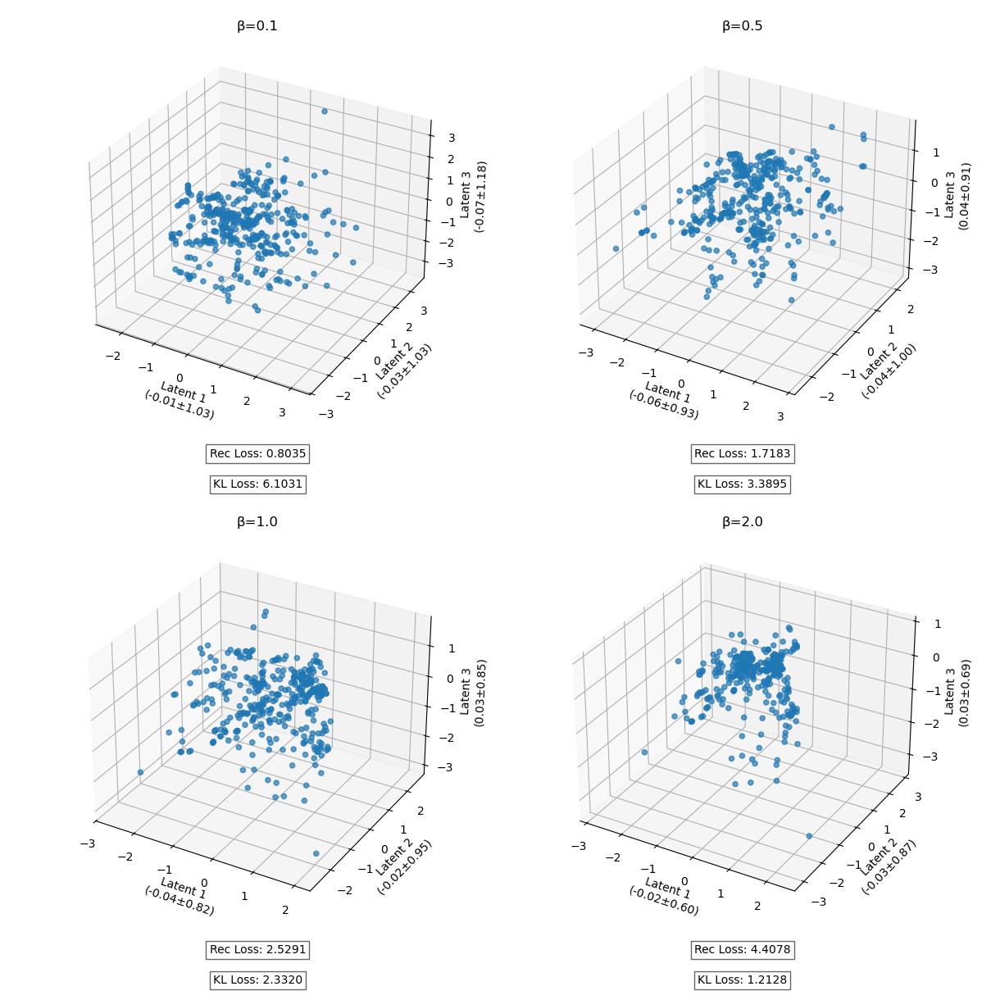

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


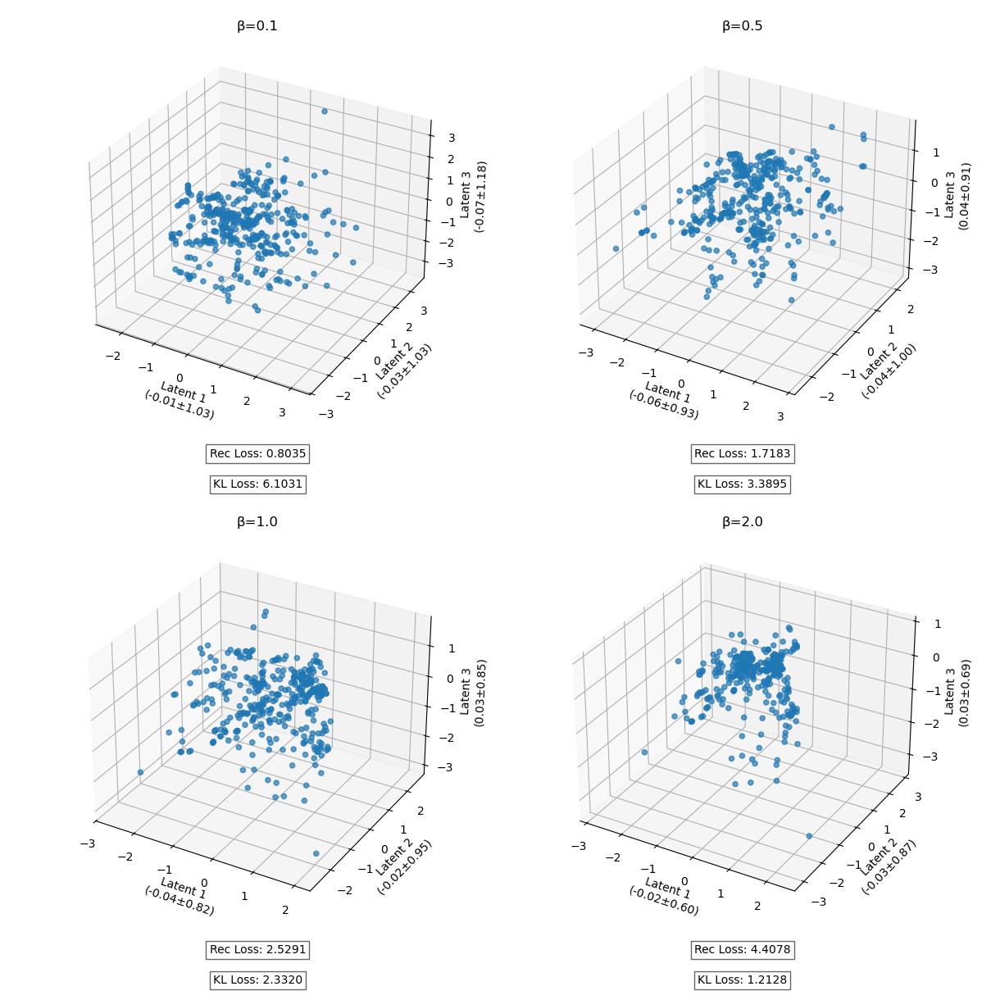

In [61]:
plot_latents_with_losses(betas, mus, recs, kls, name="beta-1.jpeg")
plot_latents_with_losses(betas, mus, recs, kls, name="beta-1.eps")

In [13]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Bridge dataset.xlsx'
problem_name = "_BT"
df2 = pd.read_excel(file_path)
df2.head()

col = ['X12','X15']
df2[col] = df2[col].astype(str)

X=df2.loc[:, df2.columns != 'Y']
y=df2['Y']

processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')

In [14]:
layers_dim = [128, 64, 32, 3]
norm_type = 'batch'
use_attention = False
activation = 'relu'
X_train = tensor(processed_df.values, dtype=torch.float32)
optimizer_type = 'adam'
lr = 1e-4
batch_size = 32
max_epochs = 500

betas = [0.1, 0.5, 1.0, 2.0,]
mus2, recs2, kls2 = [], [], []
for beta in tqdm(betas):
    model = VariationalAutoEncoder(
        num_numerical=len_numerical,
        num_categorical=len_ohes,
        layers_dim=layers_dim,
        norm_type=norm_type,
        use_attention=use_attention,
        activation=activation
    )
    
    val_loss = model.train_model(
        x_train=X_train,
        x_val=None,
        optimizer_type=optimizer_type,
        recon_loss_type='mse',
        lr=lr,
        beta_kl=beta,
        beta_rec=1,
        batch_size=batch_size,
        max_epochs=max_epochs, 
        seed=42, 
        patience=20,
        verbose=False
    )

    # Evaluate
    model.eval()
    with torch.no_grad():
        mu, logvar, z, rec = model(X_train)
        rec_loss = calc_reconstruction_loss(X_train, rec, loss_type="mse", reduction="mean").item()
        kl_loss = calc_kl(logvar, mu, reduce="mean").item()
        
    mus2.append(mu)
    recs2.append(rec_loss)
    kls2.append(kl_loss)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:57<00:00, 29.39s/it]


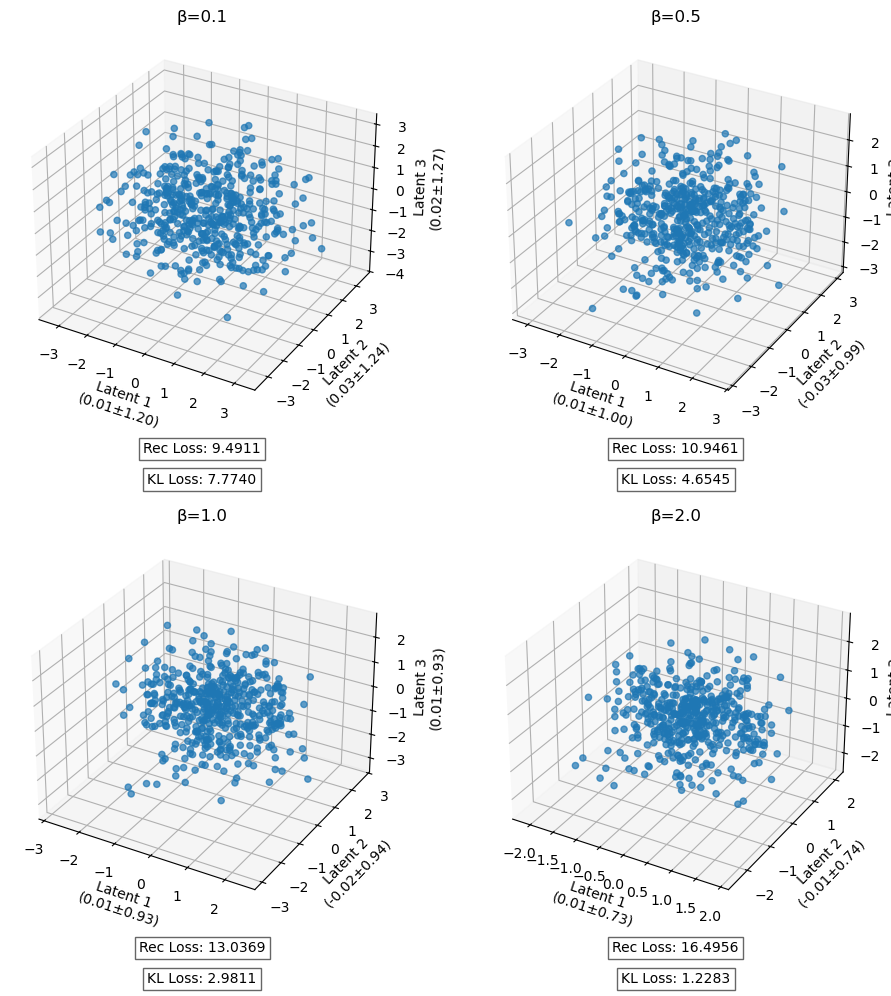

In [22]:
plot_latents_with_losses(betas, mus2, recs2, kls2)

# Optimizing

## Shear Wall

In [30]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Shear_Wall_Database.xlsx'
problem_name = "_SW"
df1 = pd.read_excel(file_path, sheet_name='Database')
df=df1.loc[:, 'FailureMode':'Ab/Ag']

X=df.loc[:, df.columns != 'FailureMode']
y=df['FailureMode']

processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')
X_TRAIN, X_VAL = train_test_split(tensor(processed_df.values, dtype=torch.float32), test_size=0.3, random_state=42)

In [3]:
def get_VAE_model(trial):
    # Suggest hyperparameters
    start_dim = trial.suggest_categorical("start_dim", [512, 256, 128, 64])
    depth = trial.suggest_int("depth", 2, 4)  # number of layers before latent
    layers_dim = [start_dim // (2 ** i) for i in range(depth)]
    latent_dim = 3
    layers_dim.append(latent_dim)
    norm_type = trial.suggest_categorical("norm_type", ['batch', 'layer', None])
    use_attention = trial.suggest_categorical("use_attention", [True, False])
    activation = trial.suggest_categorical("activation", ['relu', 'leaky_relu', 'gelu'])
    optimizer_type = trial.suggest_categorical("optimizer", ['adam', 'adamw', 'sgd'])
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128])
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)
    max_epochs = trial.suggest_int("max_epochs", 50, 500, step=50) 

    # Prepare VAE model
    model = VariationalAutoEncoder(
        num_numerical=len_numerical,
        num_categorical=len_ohes,
        layers_dim=layers_dim,
        norm_type=norm_type,
        use_attention=use_attention,
        activation=activation
    )
    
    val_loss = model.train_model(
        x_train=X_TRAIN,
        x_val=X_VAL,
        optimizer_type=optimizer_type,
        recon_loss_type='mse',
        lr=lr,
        beta_kl=0.5,
        beta_rec=1,
        batch_size=batch_size,
        max_epochs=max_epochs, 
        seed=42, 
        patience=20
    )
    return model, val_loss
    
def objective(trial):
    _, val_loss = get_VAE_model(trial)
    return val_loss

### VAE

In [4]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=200, show_progress_bar=True)

  0%|          | 0/200 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [9]:
study.best_params 

{'start_dim': 512,
 'depth': 3,
 'norm_type': None,
 'use_attention': False,
 'activation': 'relu',
 'optimizer': 'adam',
 'batch_size': 32,
 'lr': 0.004695004881868407,
 'max_epochs': 200}

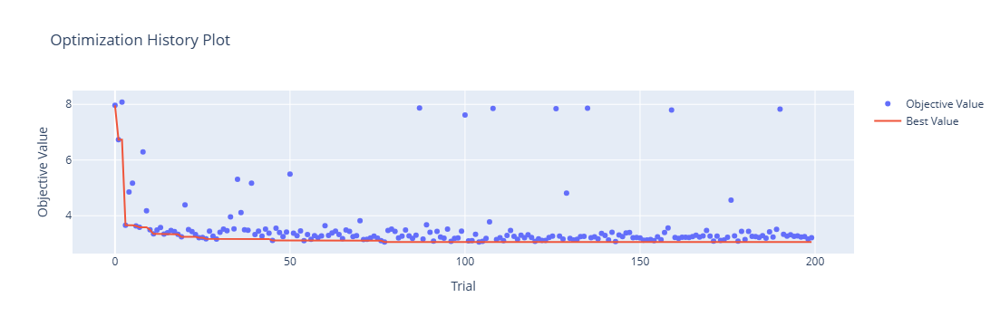

In [12]:
fig= vis.plot_optimization_history(study)
fig.show()

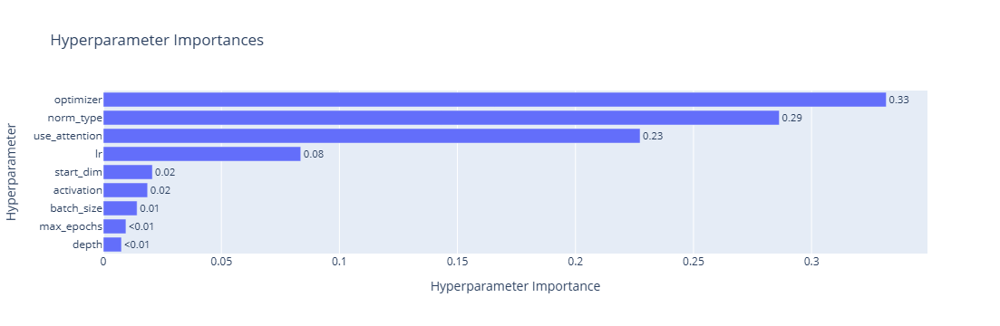

In [13]:
fig= vis.plot_param_importances(study)
fig.show()

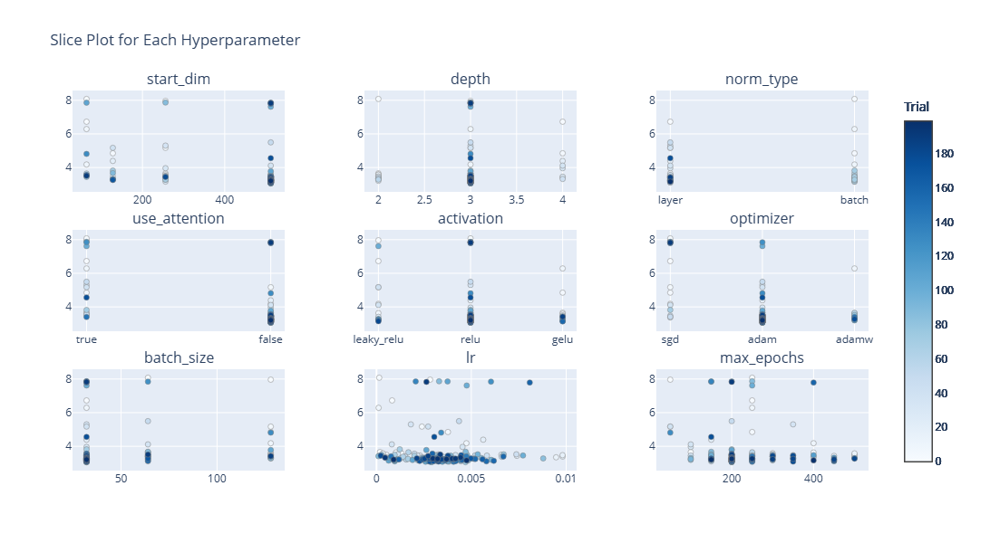

In [30]:
num_cols = 3

params = list(study.best_trial.params.keys())
num_params = len(params)
num_rows = math.ceil(num_params / num_cols)
fig = make_subplots(rows=num_rows, cols=num_cols, 
                    subplot_titles=params, 
                    vertical_spacing=0.1, horizontal_spacing=0.1)

for i, param in enumerate(params):
    row = (i // num_cols) + 1
    col = (i % num_cols) + 1
    slice_fig = vis.plot_slice(study, params=[param])
    for trace in slice_fig['data']:
        fig.add_trace(trace, row=row, col=col)
fig.update_layout(height=200 * num_rows,
                  width=300 * num_cols,
                  showlegend=False,
                  title_text="Slice Plot for Each Hyperparameter")
fig.show()

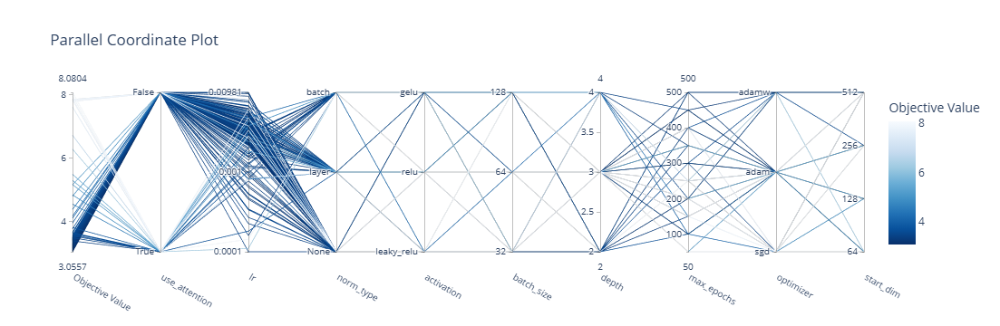

In [16]:
fig = vis.plot_parallel_coordinate(study)
fig.show()

### PCA vs VAE

In [62]:
df=df1.loc[:, 'FailureMode':'Ab/Ag']

X=df.loc[:, df.columns != 'FailureMode']
y=df['FailureMode']

processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')
X_TRAIN, X_VAL = train_test_split(tensor(processed_df.values, dtype=torch.float32), test_size=0.3, random_state=42)

In [63]:
best_param = {'start_dim': 512,
 'depth': 3,
 'norm_type': None,
 'use_attention': False,
 'activation': 'relu',
 'optimizer': 'adam',
 'batch_size': 32,
 'lr': 0.004695004881868407,
 'max_epochs': 200}

In [64]:
# VAE
fixed_trial = optuna.trial.FixedTrial(best_param)
model, val_loss = get_VAE_model(fixed_trial)

X_tensor = tensor(processed_df.values, dtype=torch.float32)
model.eval()
with torch.no_grad():
    mu, _, _, recon_data = model(X_tensor)
    
z_sample = torch.randn(size=(X_tensor.shape[0], 3))
synth_data = model.sample(z_sample)

recon_df_VAE = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df_VAE[cols] = recon_df_VAE[cols].clip(lower=0)

In [65]:
# PCA
pca = PCA(n_components=3)
_ = pca.fit(processed_df.values)
synth_data = pca.inverse_transform(np.array(z_sample))

recon_df_PCA = reverse_process_dataframe(tensor(synth_data), len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df_PCA[cols] = recon_df_PCA[cols].clip(lower=0)

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def distribution_comparison(real_data, syn_PCA, syn_VAE, n_bins=10, columns=None,  
                            rename_dict=None, filename=None):
    if columns is None:
        columns = real_data.columns  # Use all columns if not specified

    num_columns = len(columns)
    fig, axes = plt.subplots(num_columns, 2, figsize=(12, 5 * num_columns), sharey=False)
    
    # If only one column, axes might be 1D, make it 2D for consistency
    if num_columns == 1:
        axes = axes.reshape(1, 2)

    synthetic_list = [syn_PCA, syn_VAE]
    alpha = 0.5
    for col_idx, col in enumerate(columns):
        real_col = real_data[col]

        for ax_idx, synthetic_data in enumerate(synthetic_list):
            synthetic_col = synthetic_data[col]
            x_label = rename_dict[col] if rename_dict and col in rename_dict else col
            ax = axes[col_idx, ax_idx]

            # Check if categorical
            if real_col.dtype == 'object' or synthetic_col.dtype == 'object':
                if rename_dict:
                    real_col_mapped = real_col.map(rename_dict)
                    synthetic_col_mapped = synthetic_col.map(rename_dict)
                else:
                    real_col_mapped = real_col
                    synthetic_col_mapped = synthetic_col

                sns.histplot(real_col_mapped, ax=ax, color='blue', label='Real', alpha=alpha, discrete=True)
                sns.histplot(synthetic_col_mapped, ax=ax, color='orange', label='Synthetic', alpha=alpha, discrete=True)
                ax.set_xlabel(x_label)
                ax.legend()
            else:
                min_val = min(real_col.min(), synthetic_col.min())
                max_val = max(real_col.max(), synthetic_col.max())
                bin_range = np.linspace(min_val, max_val, n_bins)

                sns.histplot(real_col, kde=True, ax=ax, color='blue', label='Real', alpha=alpha, bins=bin_range)
                sns.histplot(synthetic_col, kde=True, ax=ax, color='orange', label='Synthetic', alpha=alpha, bins=bin_range)
                ax.set_xlabel(x_label)
                ax.legend()
    
    fig.text(0.25, 0.01, '(a) PCA', ha='center', fontsize=14)
    fig.text(0.75, 0.01, '(b) VAE', ha='center', fontsize=14)
    plt.tight_layout(rect=[0, 0.02, 1, 1])

    if filename is not None:
        plt.savefig(filename, bbox_inches='tight', dpi=600)
    
    plt.show()


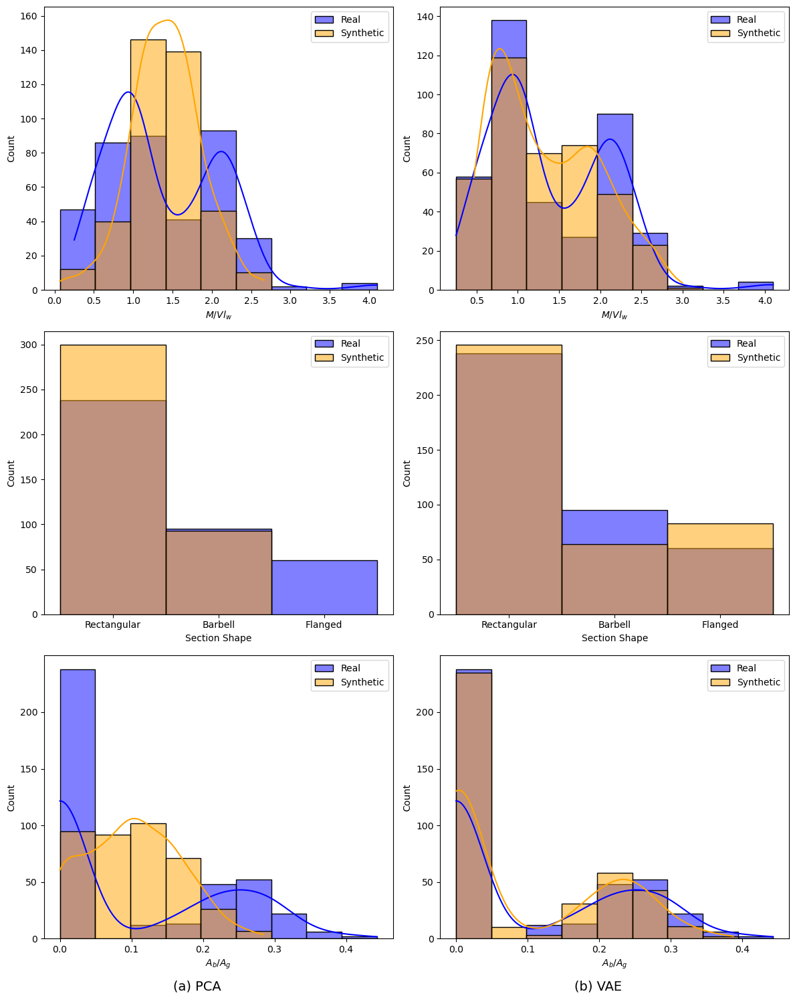

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


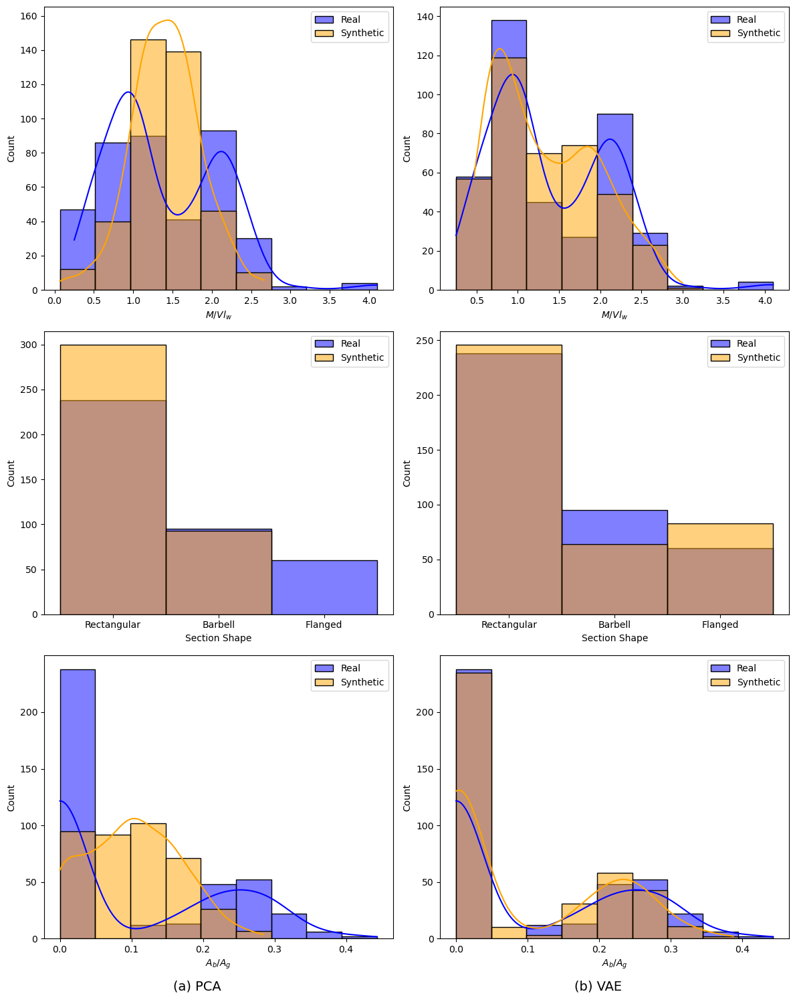

In [62]:
rename_dict = {
    'M/Vlw': r'$M/Vl_{w}$',
    'lw/tw': r'$l_{w}/t_{w}$',
    'ρvwFy,vw/fc': r'$\rho_{vw}F_{y,vw}/f_{c}^\prime$',
    'ρhwFy,hw/fc': r'$\rho_{hw}F_{y,hw}/f_{c}^\prime$',
    'ρvbFy,vb/fc': r'$\rho_{vb}F_{y,vb}/f_{c}^\prime$',
    'ρhbFy,hb/fc': r'$\rho_{hb}F_{y,hb}/f_{c}^\prime$',
    'P/fcAg': r'$P/f_{c}^\prime A_{g}$',
    'Section': 'Section Shape',
    'Section_B': 'Barbell',
    'Section_R': 'Rectangular',
    'Section_F': 'Flanged',
    'Ab/Ag': r'$A_{b}/A_{g}$',
    'R': 'Rectangular',
    'F': 'Flanged',
    'B': 'Barbell'
}

distribution_comparison(X, recon_df_PCA, recon_df_VAE, columns=['M/Vlw','Section','Ab/Ag'], 
                        rename_dict=rename_dict, filename="Journal/dist_PCA_VAE.jpeg")
distribution_comparison(X, recon_df_PCA, recon_df_VAE, columns=['M/Vlw','Section','Ab/Ag'], 
                        rename_dict=rename_dict, filename="Journal/dist_PCA_VAE.eps") 

In [63]:
def corrmap_comparison(real_data, syn_PCA, syn_VAE, rename_dict=None, filename=None):
    def one_hot_encode(df):
        categorical_cols = df.select_dtypes(include=['object', 'category']).columns
        return pd.get_dummies(df, columns=categorical_cols)

    real_data_encoded = one_hot_encode(real_data)
    syn_PCA_encoded = one_hot_encode(syn_PCA)
    syn_VAE_encoded = one_hot_encode(syn_VAE)

    real_corr = real_data_encoded.corr()
    syn_PCA_corr = syn_PCA_encoded.corr()
    syn_VAE_corr = syn_VAE_encoded.corr()

    common_order = real_corr.columns
    real_corr = real_corr.reindex(index=common_order, columns=common_order)
    syn_PCA_corr = syn_PCA_corr.reindex(index=common_order, columns=common_order)
    syn_VAE_corr = syn_VAE_corr.reindex(index=common_order, columns=common_order)

    if rename_dict:
        real_corr = real_corr.rename(index=rename_dict, columns=rename_dict)
        syn_PCA_corr = syn_PCA_corr.rename(index=rename_dict, columns=rename_dict)
        syn_VAE_corr = syn_VAE_corr.rename(index=rename_dict, columns=rename_dict)

    diff_corr_PCA = abs(real_corr - syn_PCA_corr)
    diff_corr_VAE = abs(real_corr - syn_VAE_corr)

    # Compute common color limits for both difference heatmaps
    vmin = min(diff_corr_PCA.min().min(), diff_corr_VAE.min().min())
    vmax = max(diff_corr_PCA.max().max(), diff_corr_VAE.max().max())

    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    # Plot first heatmap without colorbar
    sns.heatmap(diff_corr_PCA, ax=axes[0], cmap='coolwarm', annot=True, fmt=".2f",
                cbar=False, vmin=vmin, vmax=vmax)

    # Plot second heatmap without colorbar
    sns.heatmap(diff_corr_VAE, ax=axes[1], cmap='coolwarm', annot=True, fmt=".2f",
                cbar=False, vmin=vmin, vmax=vmax)
    axes[1].set_yticklabels([])
    axes[1].set_ylabel("")

    # Create a single colorbar on the right of the second plot
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.1)

    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = mpl.cm.ScalarMappable(cmap='coolwarm', norm=norm)
    sm.set_array([])
    fig.colorbar(sm, cax=cax)
    
    fig.text(0.25, 0.01, '(a) PCA', ha='center', fontsize=14)
    fig.text(0.75, 0.01, '(b) VAE', ha='center', fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 1])

    if filename:
        fig.savefig(filename, bbox_inches='tight', dpi=600)
    
    plt.show()

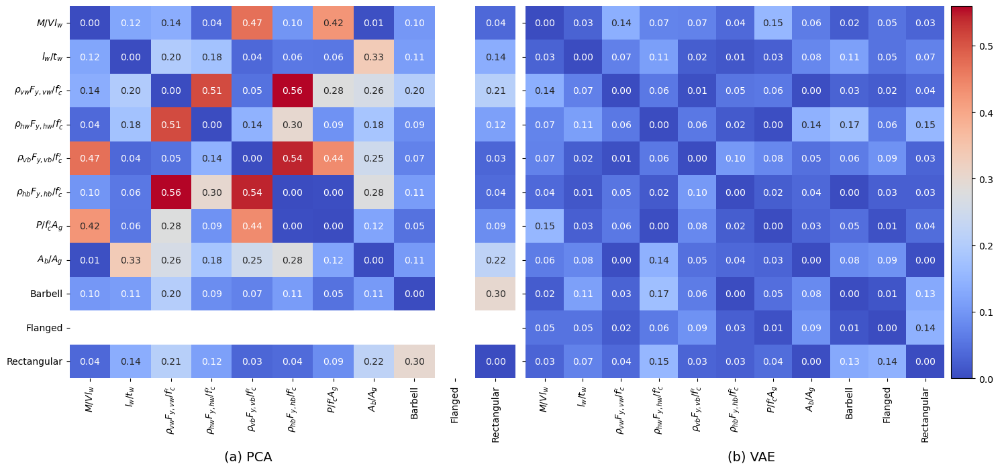

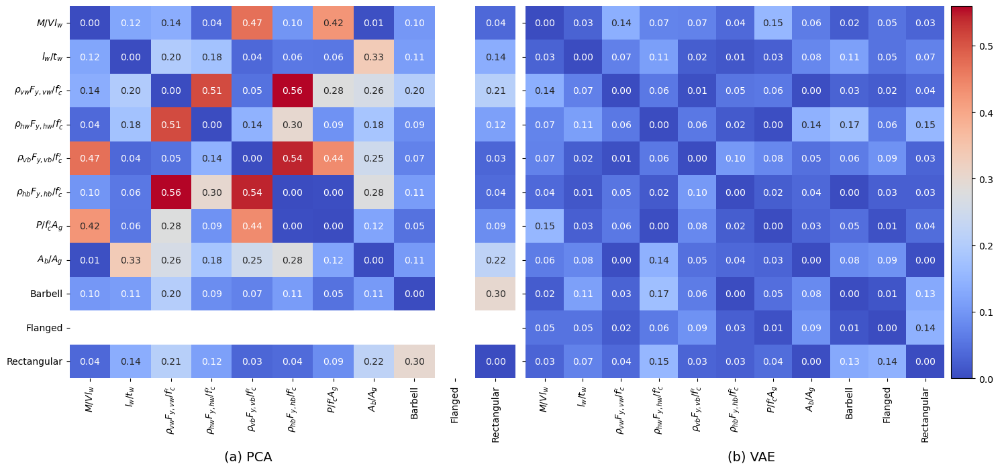

In [64]:
corrmap_comparison(X, recon_df_PCA, recon_df_VAE, rename_dict=rename_dict, filename="Journal/corr_PCA_VAE.jpeg")
corrmap_comparison(X, recon_df_PCA, recon_df_VAE, rename_dict=rename_dict, filename="Journal/corr_PCA_VAE.eps")

### Data

In [31]:
best_param = {'start_dim': 512,
 'depth': 3,
 'norm_type': None,
 'use_attention': False,
 'activation': 'relu',
 'optimizer': 'adam',
 'batch_size': 32,
 'lr': 0.004695004881868407,
 'max_epochs': 200}

In [32]:
features=processed_df.values
label=df['FailureMode'] - 1

num_classes = len(label.unique())
id_feature = np.array(features)
id_label = np.array(label) 

X, y = {}, {}
X['train'], X['test'], y['train'], y['test'] = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)

# Apply SMOTE to handle imbalance dataset
smote = SMOTE(random_state=42)
X['train-smote'], y['train-smote'] = smote.fit_resample(X['train'], y['train'])

X = numpy_to_tensor(X, dtype=torch.float32)
y = numpy_to_tensor(y, dtype=torch.int64)

# VAE
fixed_trial = optuna.trial.FixedTrial(best_param)
model, val_loss = get_VAE_model(fixed_trial)

model.eval()
with torch.no_grad():
    mu, _, _, recon_data = model(X['train'])

# generate ood sample and transform back into original distribution
min_dist = 1.5
offset = 0.5
softness = 1

max_rad = max(l2dist(mu))[0]
far_rad_in = max_rad + 3
far_rad_out = far_rad_in + 10

# hard brownian offset guarantee samples at least d_min distance away from rest of sample
ood_lv_train = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['train']))
X['ood-train'] = model.sample(tensor(ood_lv_train, dtype=torch.float32)).detach()

ood_lv = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['test'])//4)
X['ood-test'] = model.sample(tensor(ood_lv, dtype=torch.float32)).detach()

lv_far = generate_nd_gaussian(far_rad_in, far_rad_out, d=3, num_samples=len(X['test'])//4)
X['ood-far-test'] = model.sample(tensor(lv_far, dtype=torch.float32)).detach()

Xnum = tensor_to_numpy(X)
ynum = tensor_to_numpy(y)

Xnum['test-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test']), axis=0)
ynum['test-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64)), axis=0)
Xnum['test-far-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test'], Xnum['ood-far-test']), axis=0)
ynum['test-far-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']) +len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)
ynum['mask'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64),
                               -np.ones(len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)

### ML

In [6]:
def ML_objective(trial, model_type, method):
    model_params = get_params(trial, model_type)
    base_model = get_model(model_type, model_params)

    if method == 'ori':  
        use_class_weight = False
        X_id_all, y_id_all = Xnum['train'], ynum['train']
    elif method == 'smote':  
        use_class_weight = False
        X_id_all, y_id_all = Xnum['train-smote'], ynum['train-smote']
    elif method == 'weight': 
        use_class_weight = True
        X_id_all, y_id_all = Xnum['train'], ynum['train']
    else:
        raise ValueError(f"Unknown method: {method}")

    X_ood_all = Xnum['ood-train']
    y_ood_all = np.zeros(len(X_ood_all), dtype=y_id_all.dtype)

    X_combined = np.concatenate([X_id_all, X_ood_all])
    y_combined = np.concatenate([y_id_all + 1, y_ood_all]) # make id start from 1

    
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1_scores = []

    for train_idx, val_idx in skf.split(X_combined, y_combined):
        X_train_val, X_val = X_combined[train_idx], X_combined[val_idx]
        y_train_val, y_val = y_combined[train_idx], y_combined[val_idx]

        # Separate ID and OOD in training split
        id_mask = y_train_val != 0
        ood_mask = y_train_val == 0

        X_id_train = X_train_val[id_mask]
        y_id_train = y_train_val[id_mask] - 1 # make id start from 0
        X_ood_train = X_train_val[ood_mask]

        # Initialize model
        model = OODModel(
            model_type=None,
            model_instance=clone(base_model),
            use_class_weight=use_class_weight,
            hierarchical_model=True
        )
        model.train(X_id_train, y_id_train, X_ood_train)

        # Predict on validation set (ID + OOD combined)
        y_pred = model.predict(X_val)
        score = f1_score(y_val, y_pred, average='macro')
        f1_scores.append(score)
    return np.mean(f1_scores)  # Optuna minimizes this

def get_params(trial, model_type):
    if model_type == 'xgboost':
        return {
            'n_estimators': trial.suggest_int('n_estimators', 50, 250),
            'max_depth': trial.suggest_int('max_depth', 3, 8),
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'gamma': trial.suggest_float('gamma', 0.0, 5.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
            'random_state': 0,
        }
    elif model_type == 'lightgbm':
        return {
            'n_estimators': trial.suggest_int('n_estimators', 50, 250),
            'max_depth': trial.suggest_int('max_depth', -1, 8),  # keep in line with others
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
            'num_leaves': trial.suggest_int('num_leaves', 7, 256),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
            'random_state': 0,
            'verbose': -1,
        }
    elif model_type == 'catboost':
        return {
            'iterations': trial.suggest_int('iterations', 50, 250), 
            'depth': trial.suggest_int('depth', 3, 8), 
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
            'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 0.0, 5.0),  # like reg_lambda
            'border_count': trial.suggest_int('border_count', 32, 255),
            'random_state': 0,
            'verbose': 0,
        }
    else:
        raise ValueError(f"Unsupported model_type: {model_type}")

def get_model(model_type, model_params):
    if model_type == 'xgboost':
        return XGBClassifier(**model_params)
    elif model_type == 'lightgbm':
        return LGBMClassifier(**model_params)
    elif model_type == 'catboost':
        return CatBoostClassifier(**model_params)

def get_ood_model(model_params, model_type, method):
    # Get hyperparameters from Optuna trial
    base_model = get_model(model_type, model_params)
    
    # Prepare training data
    if method == 'ori':  
        use_class_weight = False
        X_train, y_train = Xnum['train'], ynum['train']
    elif method == 'smote':  
        use_class_weight = False
        X_train, y_train = Xnum['train-smote'], ynum['train-smote']
    elif method == 'weight': 
        use_class_weight = True
        X_train, y_train = Xnum['train'], ynum['train']
    else:
        raise ValueError(f"Unknown method {method}")

    # Initialize and train the model
    model = OODModel(
        model_type=None,
        model_instance=base_model,
        use_class_weight=use_class_weight,
        hierarchical_model=True
    )
    model.train(X_train, y_train, Xnum['ood-train'])
    return model

Starting Optuna study for xgboost-ori...


  0%|          | 0/200 [00:00<?, ?it/s]

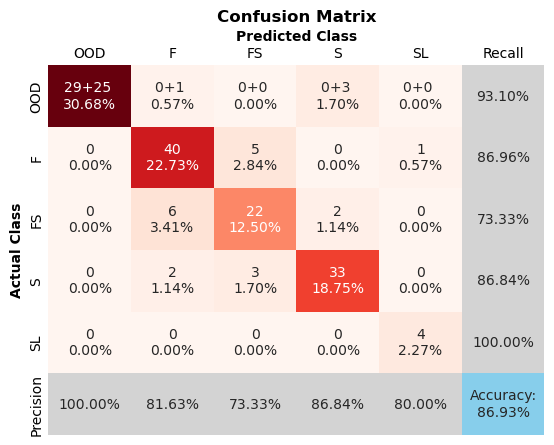

Starting Optuna study for xgboost-smote...


  0%|          | 0/200 [00:00<?, ?it/s]

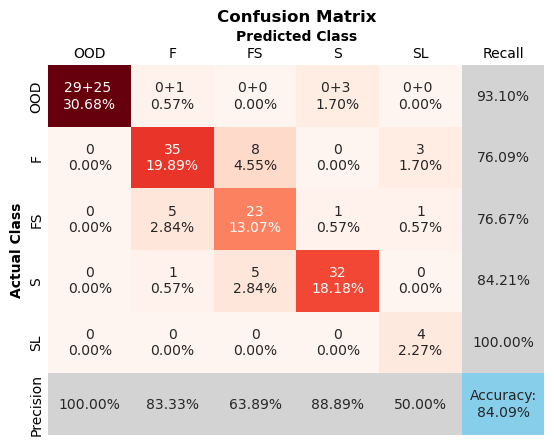

Starting Optuna study for xgboost-weight...


  0%|          | 0/200 [00:00<?, ?it/s]

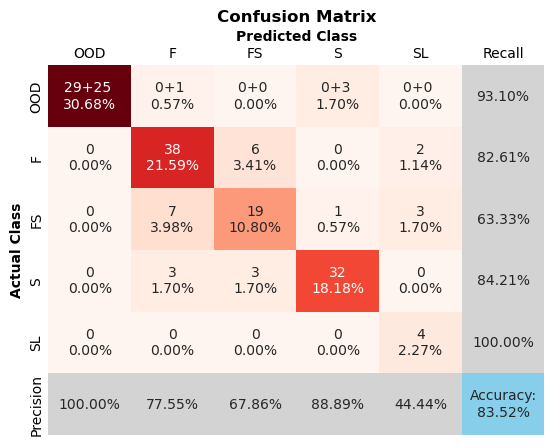

Starting Optuna study for lightgbm-ori...


  0%|          | 0/200 [00:00<?, ?it/s]

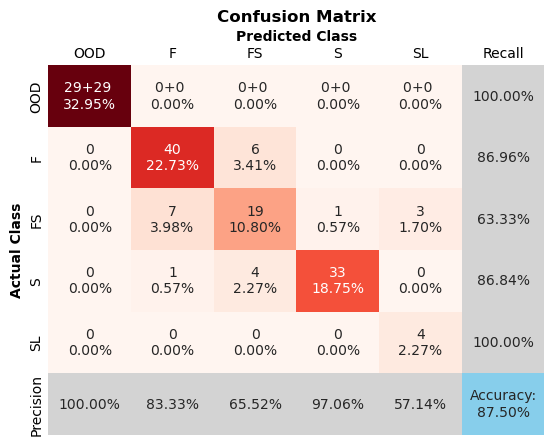

Starting Optuna study for lightgbm-smote...


  0%|          | 0/200 [00:00<?, ?it/s]

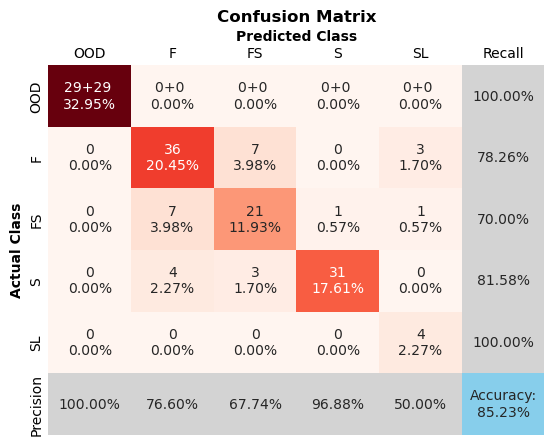

Starting Optuna study for lightgbm-weight...


  0%|          | 0/200 [00:00<?, ?it/s]

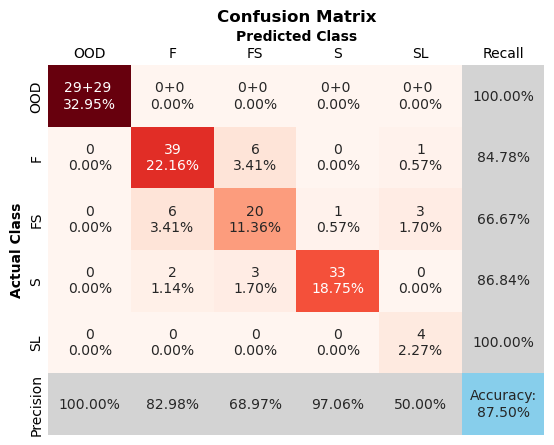

Starting Optuna study for catboost-ori...


  0%|          | 0/200 [00:00<?, ?it/s]

0:	learn: 0.2229246	total: 2.22ms	remaining: 529ms
1:	learn: 0.0707599	total: 4ms	remaining: 474ms
2:	learn: 0.0307660	total: 5.6ms	remaining: 441ms
3:	learn: 0.0177704	total: 7.08ms	remaining: 416ms
4:	learn: 0.0101830	total: 8.53ms	remaining: 399ms
5:	learn: 0.0051428	total: 9.96ms	remaining: 387ms
6:	learn: 0.0033027	total: 11.4ms	remaining: 377ms
7:	learn: 0.0023563	total: 12.8ms	remaining: 371ms
8:	learn: 0.0017414	total: 14.5ms	remaining: 370ms
9:	learn: 0.0012586	total: 16.1ms	remaining: 368ms
10:	learn: 0.0011133	total: 17.6ms	remaining: 364ms
11:	learn: 0.0009100	total: 19ms	remaining: 359ms
12:	learn: 0.0007715	total: 20.7ms	remaining: 359ms
13:	learn: 0.0006699	total: 22.1ms	remaining: 355ms
14:	learn: 0.0006085	total: 23.6ms	remaining: 352ms
15:	learn: 0.0005359	total: 25.1ms	remaining: 350ms
16:	learn: 0.0005358	total: 26.3ms	remaining: 343ms
17:	learn: 0.0005358	total: 27.4ms	remaining: 336ms
18:	learn: 0.0004738	total: 28.9ms	remaining: 334ms
19:	learn: 0.0004737	total: 

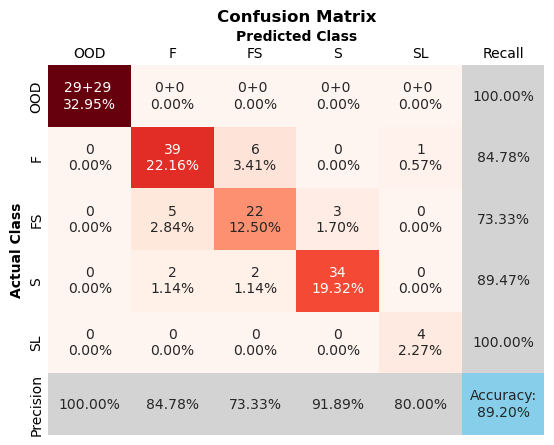

Starting Optuna study for catboost-smote...


  0%|          | 0/200 [00:00<?, ?it/s]

0:	learn: 0.4926405	total: 2.53ms	remaining: 600ms
1:	learn: 0.3321253	total: 5.02ms	remaining: 592ms
2:	learn: 0.2464777	total: 7.22ms	remaining: 565ms
3:	learn: 0.1697330	total: 9.59ms	remaining: 561ms
4:	learn: 0.1262816	total: 12.1ms	remaining: 562ms
5:	learn: 0.0940833	total: 14.4ms	remaining: 555ms
6:	learn: 0.0706998	total: 16.8ms	remaining: 553ms
7:	learn: 0.0539423	total: 19.1ms	remaining: 548ms
8:	learn: 0.0408268	total: 21.6ms	remaining: 550ms
9:	learn: 0.0324232	total: 24ms	remaining: 547ms
10:	learn: 0.0260633	total: 26.3ms	remaining: 543ms
11:	learn: 0.0203842	total: 28.4ms	remaining: 536ms
12:	learn: 0.0165814	total: 30.5ms	remaining: 529ms
13:	learn: 0.0138244	total: 32.7ms	remaining: 523ms
14:	learn: 0.0116067	total: 34.9ms	remaining: 518ms
15:	learn: 0.0100114	total: 37.1ms	remaining: 515ms
16:	learn: 0.0087655	total: 39.3ms	remaining: 511ms
17:	learn: 0.0076663	total: 41.6ms	remaining: 509ms
18:	learn: 0.0066597	total: 44.1ms	remaining: 509ms
19:	learn: 0.0057738	tot

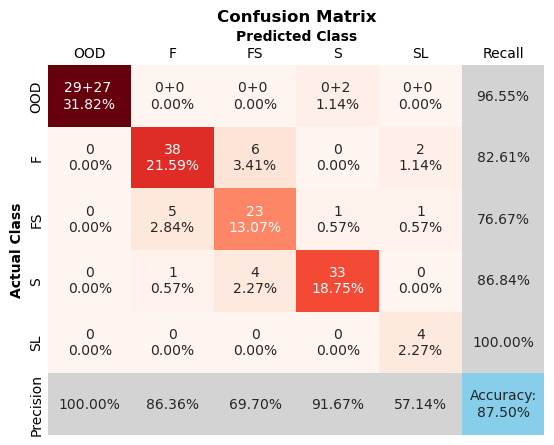

Starting Optuna study for catboost-weight...


  0%|          | 0/200 [00:00<?, ?it/s]

0:	learn: 0.4974660	total: 649us	remaining: 109ms
1:	learn: 0.3734520	total: 1.49ms	remaining: 123ms
2:	learn: 0.2863997	total: 2.02ms	remaining: 111ms
3:	learn: 0.2224095	total: 2.55ms	remaining: 104ms
4:	learn: 0.1739018	total: 3.09ms	remaining: 101ms
5:	learn: 0.1399257	total: 3.63ms	remaining: 97.9ms
6:	learn: 0.1124429	total: 4.22ms	remaining: 97ms
7:	learn: 0.0916200	total: 4.78ms	remaining: 95.6ms
8:	learn: 0.0745102	total: 5.31ms	remaining: 93.9ms
9:	learn: 0.0598867	total: 5.86ms	remaining: 92.6ms
10:	learn: 0.0495826	total: 6.39ms	remaining: 91.2ms
11:	learn: 0.0413930	total: 6.77ms	remaining: 88ms
12:	learn: 0.0352363	total: 7.16ms	remaining: 85.4ms
13:	learn: 0.0304731	total: 7.56ms	remaining: 83.2ms
14:	learn: 0.0257914	total: 7.91ms	remaining: 80.7ms
15:	learn: 0.0226055	total: 8.28ms	remaining: 78.6ms
16:	learn: 0.0202491	total: 8.63ms	remaining: 76.6ms
17:	learn: 0.0174176	total: 8.91ms	remaining: 74.2ms
18:	learn: 0.0156411	total: 9.27ms	remaining: 72.7ms
19:	learn: 0.

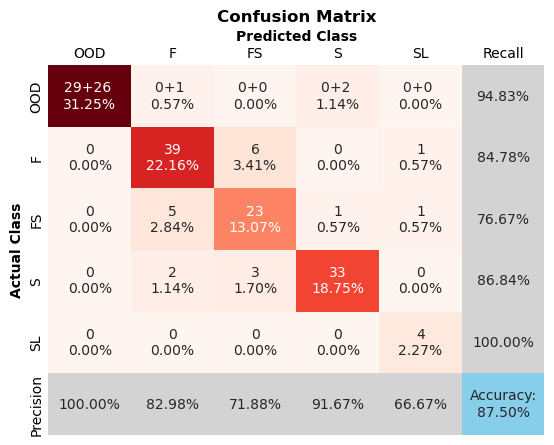

In [7]:
class_names = ["OOD","F", "FS", "S", "SL"]
problem_name = "_SW"

ML_studies = {}
best_models = {}

X_test = Xnum['test-far-cat']
y_test = ynum['test-far-cat']
y_mask = ynum['mask']
test_far = ClassificationComparison(y_test)

for model_type in ['xgboost', 'lightgbm', 'catboost']:
    for method in ['ori','smote','weight']:
        name = f"{model_type}-{method}"
        print(f"Starting Optuna study for {name}...")
        
        ML_study = optuna.create_study(direction="maximize")
        ML_study.optimize(lambda trial: ML_objective(trial, model_type, method), n_trials=200, show_progress_bar=True)
        ML_studies[name] = ML_study

        best_params = ML_study.best_params
        model = get_ood_model(best_params, model_type, method)
        y_pred = model.predict(X_test)
        test_far.calculate_metrics(y_pred, name)
        best_models[name] = model
        
        prefix = "CM/"+ name + problem_name
        _ = extended_confusion_matrix(
            y_test, y_pred,
            y_mask=y_mask,
            class_names=class_names,
            prefix=prefix
        )

In [8]:
test_far.get_metrics()

,Macro Precision,Macro Recall,Macro F1-Score,Accuracy
Method,,,,
xgboost-ori,0.843616,0.880471,0.859407,0.869318
xgboost-smote,0.772222,0.860135,0.797648,0.840909
xgboost-weight,0.757483,0.846512,0.779942,0.835227
lightgbm-ori,0.806105,0.874264,0.827814,0.875000
lightgbm-smote,0.782425,0.859680,0.803020,0.852273
lightgbm-weight,0.798006,0.876583,0.820002,0.875000
catboost-ori,0.860016,0.895179,0.875343,0.892045
catboost-smote,0.809740,0.885338,0.835245,0.875000
catboost-weight,0.826374,0.886238,0.849198,0.875000


In [55]:
xgb_studies = {k: v for k, v in ML_studies.items() if k.startswith("xgboost")}
lgb_studies = {k: v for k, v in ML_studies.items() if k.startswith("lightgbm")}
cb_studies  = {k: v for k, v in ML_studies.items() if k.startswith("catboost")}

# Helper function to convert best params into a DataFrame
def studies_to_df(study_dict, base_model):
    df = pd.DataFrame.from_dict(
        {k: v.best_params for k, v in study_dict.items()}, orient='index'
    ).reset_index()
    df.rename(columns={"index": "Method"}, inplace=True)
    return df

# Create the DataFrames
df_xgb = studies_to_df(xgb_studies, "XGBoost")
df_lgb = studies_to_df(lgb_studies, "LightGBM")
df_cb  = studies_to_df(cb_studies,  "CatBoost")

display(df_xgb)
display(df_lgb)
display(df_cb)

,Method,n_estimators,max_depth,learning_rate,subsample,colsample_bytree,gamma,reg_alpha,reg_lambda
0,xgboost-ori,155,7,0.124329,0.806979,0.841357,0.011102,0.004308,2.466243
1,xgboost-smote,123,7,0.169944,0.586582,0.708167,0.007201,0.577537,3.254701
2,xgboost-weight,214,7,0.038580,0.530681,0.818556,0.289333,0.270053,1.437169


,Method,n_estimators,max_depth,learning_rate,num_leaves,min_child_samples,subsample,colsample_bytree,reg_alpha,reg_lambda
0,lightgbm-ori,120,8,0.179924,146,12,0.832448,0.516826,0.003928,0.652810
1,lightgbm-smote,151,5,0.223926,57,47,0.601707,0.563560,0.113984,0.181595
2,lightgbm-weight,139,5,0.228707,82,11,0.771281,0.500257,0.554469,3.937094


,Method,iterations,depth,learning_rate,l2_leaf_reg,border_count
0,catboost-ori,239,5,0.218085,0.355441,152
1,catboost-smote,238,7,0.085848,0.790629,209
2,catboost-weight,168,4,0.240891,1.310613,40


In [45]:
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'ID Accuracy']
for model_name in best_models:
    model = best_models[model_name]
    metrics = get_ood_score_boost(model, Xnum['test'], ynum['test'], np.concatenate((Xnum['ood-test'], Xnum['ood-far-test']), axis=0))
    metrics_df = pd.DataFrame([metrics], index=[model_name], columns=columns)  # Convert the metrics into a 1-row DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
display(all_metrics.style.apply(highlight_ood_metrics, axis=0))

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,ID Accuracy
xgboost-ori,0.000000,1.000000,1.000000,1.000000,0.838983
xgboost-smote,0.000000,1.000000,1.000000,1.000000,0.796610
xgboost-weight,0.000000,1.000000,1.000000,1.000000,0.788136
lightgbm-ori,0.000000,1.000000,1.000000,1.000000,0.813559
lightgbm-smote,0.000000,1.000000,1.000000,1.000000,0.779661
lightgbm-weight,0.000000,1.000000,1.000000,1.000000,0.813559
catboost-ori,0.000000,1.000000,1.000000,1.000000,0.838983
catboost-smote,0.000000,1.000000,1.000000,1.000000,0.830508
catboost-weight,0.000000,1.000000,1.000000,1.000000,0.838983


### MLPs

In [34]:
class_names = ["OOD","F", "FS", "S", "SL"]
problem_name = "_SW"

X['train-cat'] = torch.cat((X['train-smote'], X['ood-train']), dim=0)
y['train-cat'] = torch.cat((y['train-smote'] + 1, torch.zeros(len(X['ood-train']), dtype=torch.long)), dim=0)
X['test-cat'] = torch.cat((X['test'], X['ood-test']), dim=0)
y['test-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long)), dim=0)
X['test-far-cat'] = torch.cat((X['test'], X['ood-test'], X['ood-far-test']), axis=0)
y['test-far-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']) + len(X['ood-far-test']), dtype=torch.long)), dim=0)
y['mask'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long) ,-torch.ones(len(X['ood-far-test']), dtype=torch.long)), dim=0)

In [35]:
set_random_seed(0)
module = MLP(X['train'].shape[1], [256, 512, 512, 512, 256], 'relu', 0.0, num_classes)

module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.15it/s]


In [36]:
detectors = ['MSP', 'KNN', 'OpenMax', 'MDS', 'RMDS', 'odin', 'gram', 'ebo',
             'gradnorm',  'mls', 'vim', 'dice', 'ash', 'she_inner']
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'Accuracy']
detector_params = dict(k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'],
                       batch_size=32, n_classes=num_classes, vim_dim=64, lr=5e-3)

for detector in detectors:
    score_function = detection_method(detector=detector, model=module, **detector_params)
    metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test'])), missclass_as_ood=False)
    
    # Convert the metrics to a DataFrame and add the detector name as the index
    metrics_df = pd.DataFrame([metrics], index=[detector], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    # Concatenate the new metrics with the existing all_metrics DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
display(all_metrics.style.apply(highlight_ood_metrics, axis=0))

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,Accuracy
MSP,0.110169,0.954120,0.980392,0.883731,0.779661
KNN,1.000000,0.281926,0.545805,0.378843,0.779661
OpenMax,0.211864,0.835184,0.937532,0.487626,0.593220
MDS,0.915254,0.171099,0.556608,0.203313,0.779661
RMDS,0.254237,0.841029,0.937032,0.545566,0.779661
odin,0.101695,0.960549,0.982600,0.929303,0.779661
gram,0.822034,0.588983,0.864551,0.687097,0.423729
ebo,0.127119,0.913647,0.966732,0.673847,0.779661
gradnorm,0.093220,0.954705,0.981311,0.906520,0.779661
mls,0.127119,0.949299,0.978618,0.860588,0.779661


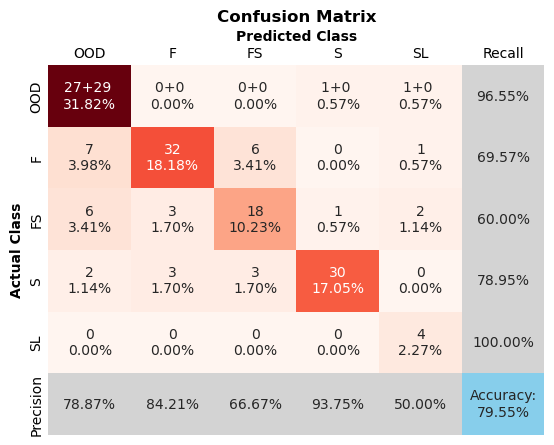

In [37]:
test_MLP = ClassificationComparison(y['test-far-cat'])
name = "MLP+OE_odin"
y_pred = module.predict_with_ood(X['test-far-cat'], detector="odin", threshold_method='roc', **detector_params)
out = extended_confusion_matrix(y['test-far-cat'], y_pred, y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_MLP.calculate_metrics(y_pred, name)

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:57<00:00,  8.73it/s]


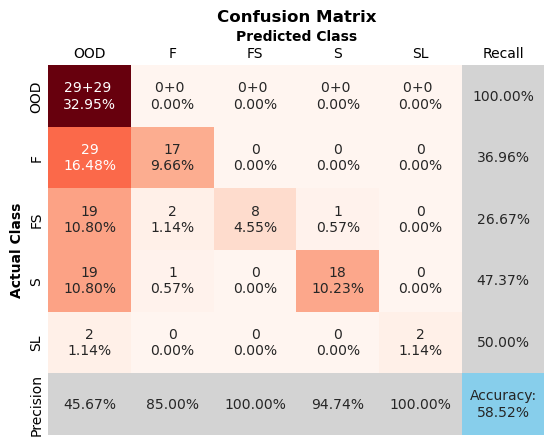

In [38]:
set_random_seed(0)
name = "Paper"
module = MLP(X['train'].shape[1], [1000, 500, 250, 500, 1000], 'relu', 0.0, num_classes)
module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

y_pred = module.predict_with_ood(X['test-far-cat'], detector="MSP", threshold_method = 'percentile')
out = extended_confusion_matrix(y['test-far-cat'], y_pred, y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_MLP.calculate_metrics(y_pred, name)

In [39]:
detector = 'MSP'
score_function = detection_method(detector=detector, model=module, **detector_params)
metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test']), axis=0), missclass_as_ood=False)
metrics_df = pd.DataFrame([metrics], index=['Paper'], columns=columns)
display(metrics_df)

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,Accuracy
Paper,0.237288,0.922925,0.96464,0.827429,0.762712


In [40]:
test_MLP.get_metrics()

,Macro Precision,Macro Recall,Macro F1-Score,Accuracy
Method,,,,
MLP+OE_odin,0.747001,0.810129,0.757102,0.795455
Paper,0.850812,0.521983,0.572295,0.585227


## Bridge

In [51]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Bridge dataset.xlsx'
problem_name = "_BT"
df2 = pd.read_excel(file_path)

col = ['X12','X15']
df2[col] = df2[col].astype(str)

X=df2.loc[:, df2.columns != 'Y']
y=df2['Y']

processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')
X_TRAIN, X_VAL = train_test_split(tensor(processed_df.values, dtype=torch.float32), test_size=0.3, random_state=42)

In [52]:
y.value_counts()

Y
2    231
0    168
1     81
Name: count, dtype: int64

### VAE

In [32]:
study2 = optuna.create_study(direction="minimize")
study2.optimize(objective, n_trials=200, show_progress_bar=True)

[I 2025-06-18 10:49:27,140] A new study created in memory with name: no-name-3f558046-fdde-48f2-95eb-54b9e472f91f


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2025-06-18 10:49:30,998] Trial 0 finished with value: 18.81254217359755 and parameters: {'start_dim': 128, 'depth': 3, 'norm_type': 'layer', 'use_attention': True, 'activation': 'leaky_relu', 'optimizer': 'adam', 'batch_size': 64, 'lr': 0.008664453082737613, 'max_epochs': 150}. Best is trial 0 with value: 18.81254217359755.
[I 2025-06-18 10:49:32,806] Trial 1 finished with value: 17.206236945258247 and parameters: {'start_dim': 512, 'depth': 2, 'norm_type': None, 'use_attention': False, 'activation': 'gelu', 'optimizer': 'adamw', 'batch_size': 64, 'lr': 0.00038151057989523984, 'max_epochs': 500}. Best is trial 1 with value: 17.206236945258247.
[I 2025-06-18 10:49:34,184] Trial 2 finished with value: 20.80418374803331 and parameters: {'start_dim': 64, 'depth': 4, 'norm_type': None, 'use_attention': False, 'activation': 'relu', 'optimizer': 'sgd', 'batch_size': 32, 'lr': 0.0007592643064593919, 'max_epochs': 300}. Best is trial 1 with value: 17.206236945258247.
[I 2025-06-18 10:49:36,3

In [33]:
study2.best_params

{'start_dim': 256,
 'depth': 3,
 'norm_type': None,
 'use_attention': False,
 'activation': 'gelu',
 'optimizer': 'adam',
 'batch_size': 32,
 'lr': 0.007896348360558544,
 'max_epochs': 100}

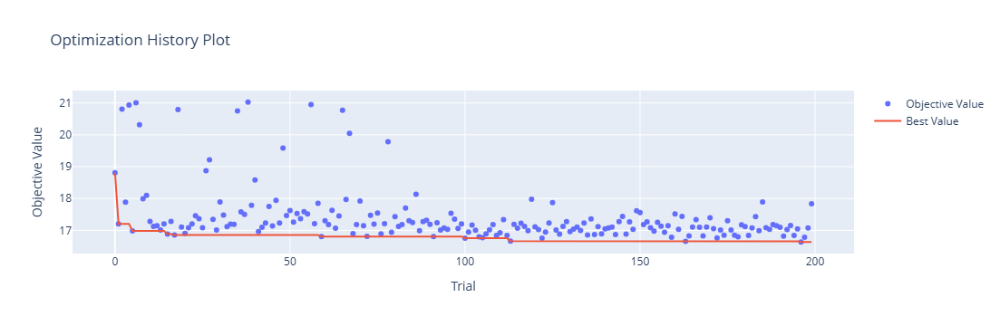

In [34]:
fig= vis.plot_optimization_history(study2)
fig.show()

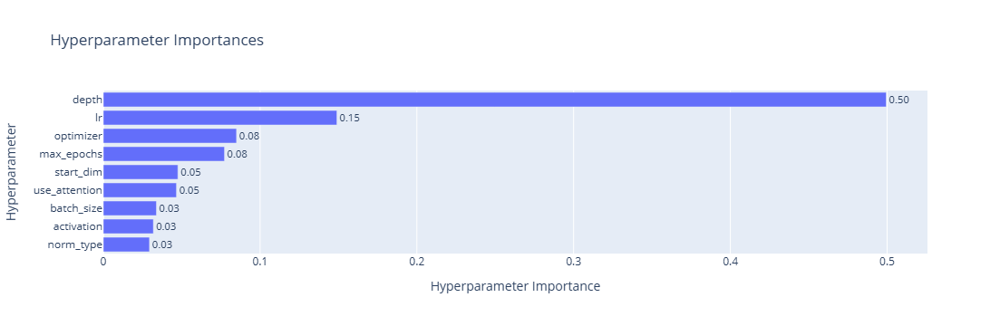

In [35]:
fig= vis.plot_param_importances(study2)
fig.show()

In [36]:
num_cols = 3

params = list(study.best_trial.params.keys())
num_params = len(params)
num_rows = math.ceil(num_params / num_cols)
fig = make_subplots(rows=num_rows, cols=num_cols, 
                    subplot_titles=params, 
                    vertical_spacing=0.1, horizontal_spacing=0.1)

for i, param in enumerate(params):
    row = (i // num_cols) + 1
    col = (i % num_cols) + 1
    slice_fig = vis.plot_slice(study2, params=[param])
    for trace in slice_fig['data']:
        fig.add_trace(trace, row=row, col=col)
fig.update_layout(height=200 * num_rows,
                  width=300 * num_cols,
                  showlegend=False,
                  title_text="Slice Plot for Each Hyperparameter")
fig.show()

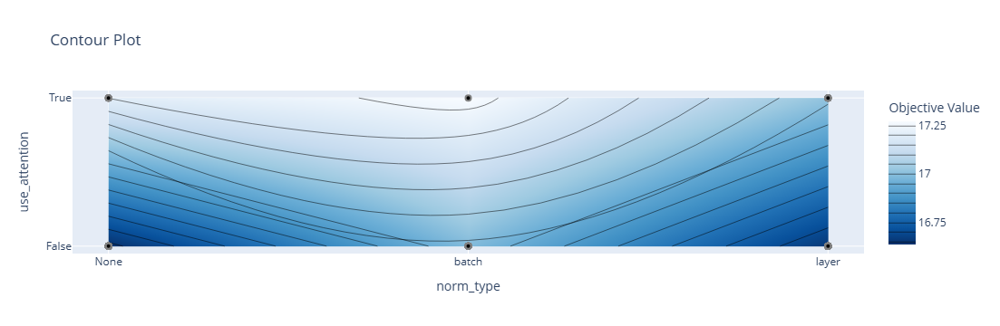

In [38]:
fig = vis.plot_contour(study2, params=["norm_type", "use_attention"])
fig.show()

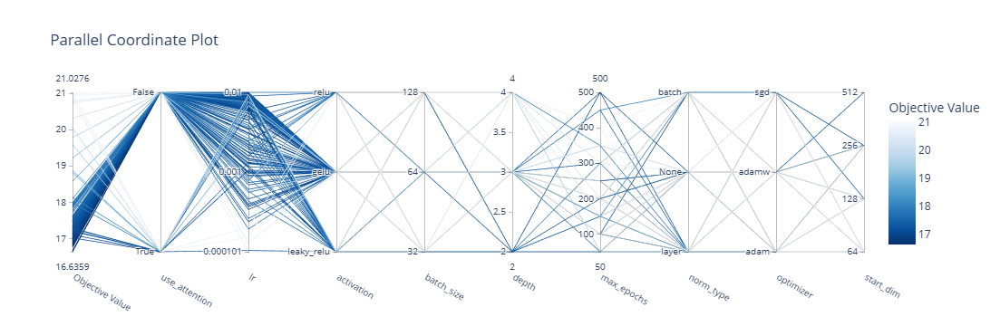

In [39]:
fig = vis.plot_parallel_coordinate(study2)
fig.show()

### ML

In [18]:
# VAE
best_params = {'start_dim': 256,
 'depth': 3,
 'norm_type': None,
 'use_attention': False,
 'activation': 'gelu',
 'optimizer': 'adam',
 'batch_size': 32,
 'lr': 0.007896348360558544,
 'max_epochs': 100}

In [19]:
features=processed_df.values
label=df2['Y']

num_classes = len(label.unique())
id_feature = np.array(features)
id_label = np.array(label) 

X, y = {}, {}
X['train'], X['test'], y['train'], y['test'] = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)

# Apply SMOTE to handle imbalance dataset
smote = SMOTE(random_state=42)
X['train-smote'], y['train-smote'] = smote.fit_resample(X['train'], y['train'])

X = numpy_to_tensor(X, dtype=torch.float32)
y = numpy_to_tensor(y, dtype=torch.int64)

fixed_trial = optuna.trial.FixedTrial(best_params)
model, val_loss = get_VAE_model(fixed_trial)

model.eval()
with torch.no_grad():
    mu, _, _, recon_data = model(X['train'])

# generate ood sample and transform back into original distribution
min_dist = 1.5
offset = 0.5
softness = 1

max_rad = max(l2dist(mu))[0]
far_rad_in = max_rad + 3
far_rad_out = far_rad_in + 10

# hard brownian offset guarantee samples at least d_min distance away from rest of sample
ood_lv_train = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['train']))
X['ood-train'] = model.sample(tensor(ood_lv_train, dtype=torch.float32)).detach()

ood_lv = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['test'])//4)
X['ood-test'] = model.sample(tensor(ood_lv, dtype=torch.float32)).detach()

lv_far = generate_nd_gaussian(far_rad_in, far_rad_out, d=3, num_samples=len(X['test'])//4)
X['ood-far-test'] = model.sample(tensor(lv_far, dtype=torch.float32)).detach()

Xnum = tensor_to_numpy(X)
ynum = tensor_to_numpy(y)

Xnum['test-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test']), axis=0)
ynum['test-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64)), axis=0)
Xnum['test-far-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test'], Xnum['ood-far-test']), axis=0)
ynum['test-far-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']) +len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)
ynum['mask'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64),
                               -np.ones(len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)

Starting Optuna study for xgboost-ori...


  0%|          | 0/200 [00:00<?, ?it/s]

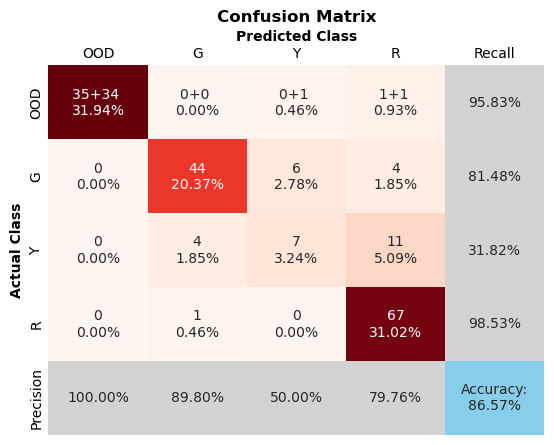

Starting Optuna study for xgboost-smote...


  0%|          | 0/200 [00:00<?, ?it/s]

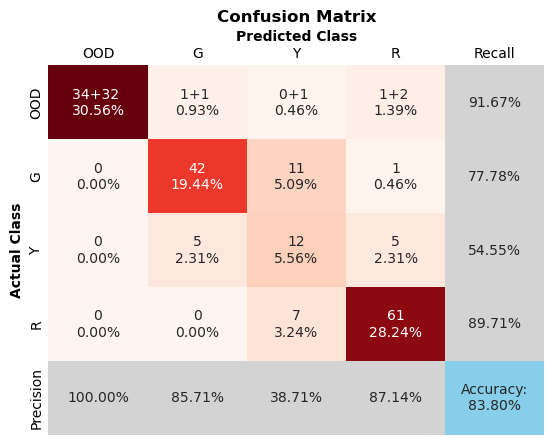

Starting Optuna study for xgboost-weight...


  0%|          | 0/200 [00:00<?, ?it/s]

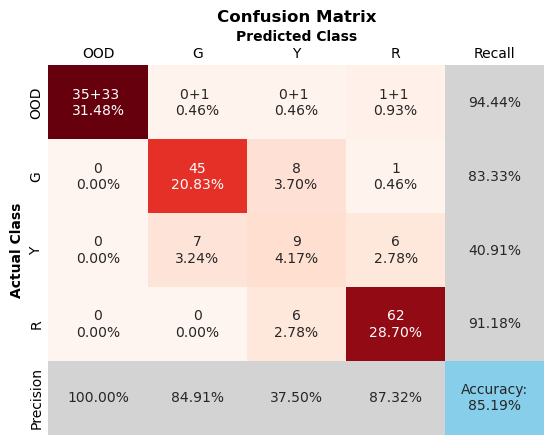

Starting Optuna study for lightgbm-ori...


  0%|          | 0/200 [00:00<?, ?it/s]

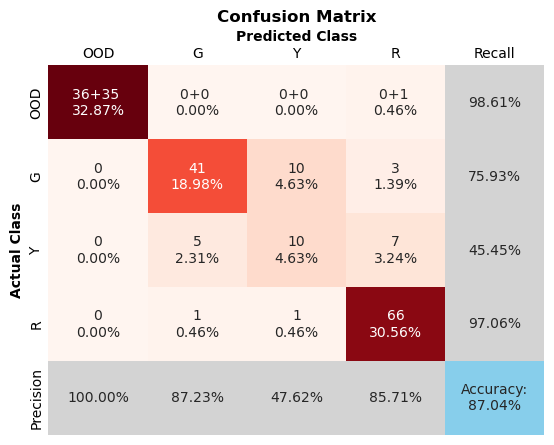

Starting Optuna study for lightgbm-smote...


  0%|          | 0/200 [00:00<?, ?it/s]

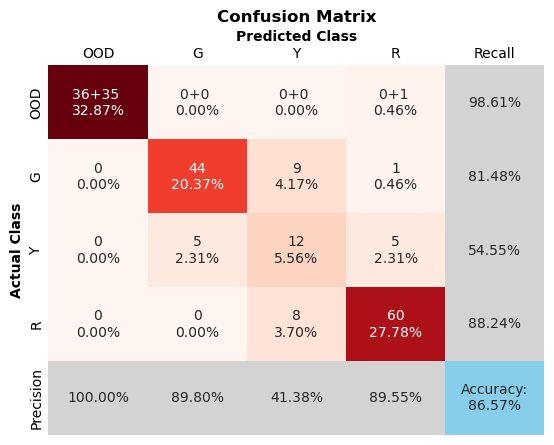

Starting Optuna study for lightgbm-weight...


  0%|          | 0/200 [00:00<?, ?it/s]

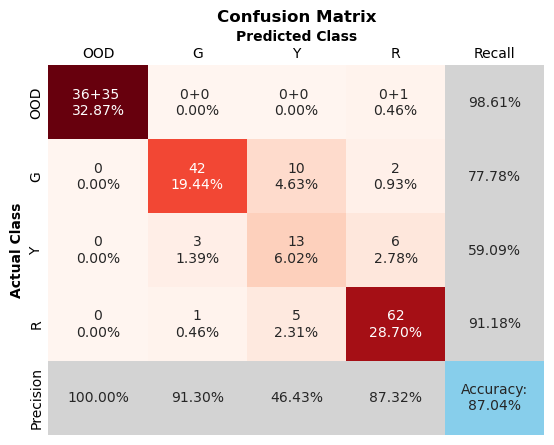

Starting Optuna study for catboost-ori...


  0%|          | 0/200 [00:00<?, ?it/s]

0:	learn: 0.3514975	total: 2.41ms	remaining: 579ms
1:	learn: 0.1908169	total: 4.75ms	remaining: 568ms
2:	learn: 0.1101652	total: 6.91ms	remaining: 548ms
3:	learn: 0.0617043	total: 8.93ms	remaining: 529ms
4:	learn: 0.0376652	total: 11ms	remaining: 518ms
5:	learn: 0.0255739	total: 12.8ms	remaining: 502ms
6:	learn: 0.0189064	total: 14.7ms	remaining: 492ms
7:	learn: 0.0172662	total: 16.6ms	remaining: 485ms
8:	learn: 0.0161274	total: 18.7ms	remaining: 482ms
9:	learn: 0.0125904	total: 20.6ms	remaining: 476ms
10:	learn: 0.0120456	total: 22.8ms	remaining: 476ms
11:	learn: 0.0088041	total: 25ms	remaining: 477ms
12:	learn: 0.0067108	total: 27ms	remaining: 474ms
13:	learn: 0.0063696	total: 29.1ms	remaining: 472ms
14:	learn: 0.0054532	total: 31.1ms	remaining: 468ms
15:	learn: 0.0052430	total: 33ms	remaining: 464ms
16:	learn: 0.0044456	total: 35ms	remaining: 461ms
17:	learn: 0.0039174	total: 36.9ms	remaining: 457ms
18:	learn: 0.0032724	total: 38.9ms	remaining: 455ms
19:	learn: 0.0032066	total: 40.9

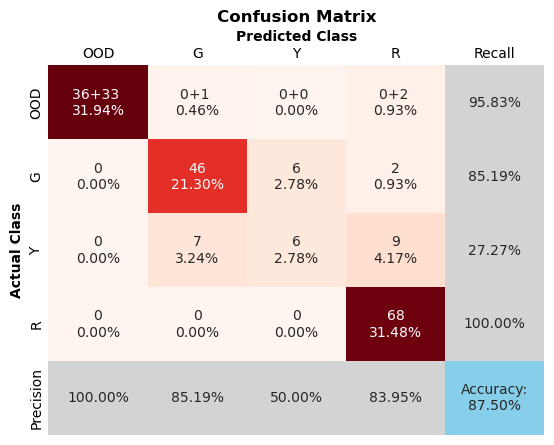

Starting Optuna study for catboost-smote...


  0%|          | 0/200 [00:00<?, ?it/s]

0:	learn: 0.3034465	total: 6.49ms	remaining: 1.02s
1:	learn: 0.1426633	total: 12.8ms	remaining: 1s
2:	learn: 0.0752481	total: 18.9ms	remaining: 981ms
3:	learn: 0.0486173	total: 24.4ms	remaining: 946ms
4:	learn: 0.0342130	total: 36.6ms	remaining: 1.13s
5:	learn: 0.0227668	total: 41.7ms	remaining: 1.06s
6:	learn: 0.0183168	total: 46.4ms	remaining: 1.01s
7:	learn: 0.0145425	total: 51.2ms	remaining: 966ms
8:	learn: 0.0106435	total: 56ms	remaining: 933ms
9:	learn: 0.0087397	total: 60.7ms	remaining: 905ms
10:	learn: 0.0069581	total: 65.9ms	remaining: 886ms
11:	learn: 0.0059873	total: 70.8ms	remaining: 867ms
12:	learn: 0.0051269	total: 75.3ms	remaining: 846ms
13:	learn: 0.0040046	total: 80.1ms	remaining: 830ms
14:	learn: 0.0033827	total: 84.8ms	remaining: 814ms
15:	learn: 0.0029972	total: 89.4ms	remaining: 799ms
16:	learn: 0.0027084	total: 94ms	remaining: 785ms
17:	learn: 0.0023119	total: 98.9ms	remaining: 775ms
18:	learn: 0.0019455	total: 103ms	remaining: 760ms
19:	learn: 0.0017127	total: 10

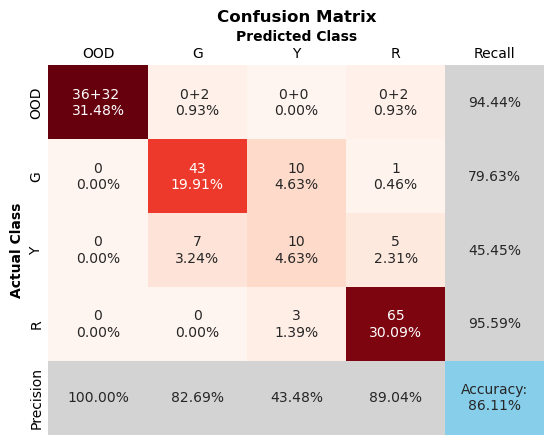

Starting Optuna study for catboost-weight...


  0%|          | 0/200 [00:00<?, ?it/s]

0:	learn: 0.5583096	total: 2.41ms	remaining: 484ms
1:	learn: 0.4585680	total: 4.67ms	remaining: 467ms
2:	learn: 0.3759971	total: 6.67ms	remaining: 443ms
3:	learn: 0.3119503	total: 8.68ms	remaining: 430ms
4:	learn: 0.2442148	total: 10.7ms	remaining: 422ms
5:	learn: 0.1995351	total: 12.9ms	remaining: 420ms
6:	learn: 0.1660127	total: 14.9ms	remaining: 415ms
7:	learn: 0.1381343	total: 17ms	remaining: 413ms
8:	learn: 0.1140284	total: 19.1ms	remaining: 410ms
9:	learn: 0.0991162	total: 21.1ms	remaining: 405ms
10:	learn: 0.0845021	total: 23.1ms	remaining: 400ms
11:	learn: 0.0695890	total: 25ms	remaining: 396ms
12:	learn: 0.0594979	total: 27.1ms	remaining: 394ms
13:	learn: 0.0518814	total: 28.8ms	remaining: 387ms
14:	learn: 0.0443239	total: 30.3ms	remaining: 378ms
15:	learn: 0.0387003	total: 31.8ms	remaining: 370ms
16:	learn: 0.0347065	total: 33.5ms	remaining: 365ms
17:	learn: 0.0301945	total: 35.2ms	remaining: 359ms
18:	learn: 0.0272044	total: 36.7ms	remaining: 353ms
19:	learn: 0.0251022	total

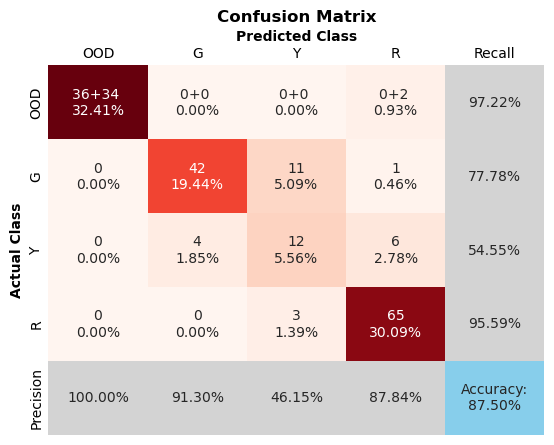

In [20]:
class_names = ["OOD", "G", "Y", "R"]
problem_name = "_BT"

ML_studies2 = {}
best_models2 = {}

X_test = Xnum['test-far-cat']
y_test = ynum['test-far-cat']
y_mask = ynum['mask']
test_far = ClassificationComparison(y_test)

for model_type in ['xgboost', 'lightgbm', 'catboost']:
    for method in ['ori','smote','weight']:
        name = f"{model_type}-{method}"
        print(f"Starting Optuna study for {name}...")
        
        ML_study = optuna.create_study(direction="maximize")
        ML_study.optimize(lambda trial: ML_objective(trial, model_type, method), n_trials=200, show_progress_bar=True)
        ML_studies2[name] = ML_study

        best_params = ML_study.best_params
        model = get_ood_model(best_params, model_type, method)
        y_pred = model.predict(X_test)
        test_far.calculate_metrics(y_pred, name)
        best_models2[name] = model
        
        prefix = "CM/"+ name + problem_name
        _ = extended_confusion_matrix(
            y_test, y_pred,
            y_mask=y_mask,
            class_names=class_names,
            prefix=prefix
        )

In [56]:
xgb_studies = {k: v for k, v in ML_studies2.items() if k.startswith("xgboost")}
lgb_studies = {k: v for k, v in ML_studies2.items() if k.startswith("lightgbm")}
cb_studies  = {k: v for k, v in ML_studies2.items() if k.startswith("catboost")}

# Helper function to convert best params into a DataFrame
def studies_to_df(study_dict, base_model):
    df = pd.DataFrame.from_dict(
        {k: v.best_params for k, v in study_dict.items()}, orient='index'
    ).reset_index()
    df.rename(columns={"index": "Method"}, inplace=True)
    return df

# Create the DataFrames
df_xgb = studies_to_df(xgb_studies, "XGBoost")
df_lgb = studies_to_df(lgb_studies, "LightGBM")
df_cb  = studies_to_df(cb_studies,  "CatBoost")

display(df_xgb)
display(df_lgb)
display(df_cb)

,Method,n_estimators,max_depth,learning_rate,subsample,colsample_bytree,gamma,reg_alpha,reg_lambda
0,xgboost-ori,172,8,0.213087,0.860351,0.836386,2.066316,0.270139,0.106320
1,xgboost-smote,184,5,0.069034,0.664748,0.643823,0.091234,0.218212,3.216868
2,xgboost-weight,123,3,0.291351,0.555551,0.510309,1.516062,0.346347,2.300119


,Method,n_estimators,max_depth,learning_rate,num_leaves,min_child_samples,subsample,colsample_bytree,reg_alpha,reg_lambda
0,lightgbm-ori,230,5,0.191168,197,90,0.669709,0.693503,0.360652,2.186078
1,lightgbm-smote,231,-1,0.045655,24,35,0.821073,0.571220,0.602063,3.336907
2,lightgbm-weight,228,6,0.243012,120,46,0.647797,0.921289,4.509846,1.206413


,Method,iterations,depth,learning_rate,l2_leaf_reg,border_count
0,catboost-ori,241,5,0.174567,1.867950,239
1,catboost-smote,159,8,0.208538,0.274678,47
2,catboost-weight,202,5,0.064769,3.279051,101


In [21]:
test_far.get_metrics()

,Macro Precision,Macro Recall,Macro F1-Score,Accuracy
Method,,,,
xgboost-ori,0.798895,0.769156,0.775890,0.865741
xgboost-smote,0.778917,0.784239,0.777236,0.837963
xgboost-weight,0.774324,0.774658,0.773985,0.851852
lightgbm-ori,0.801418,0.792626,0.795087,0.870370
lightgbm-smote,0.801819,0.807183,0.801713,0.865741
lightgbm-weight,0.812642,0.816641,0.811273,0.870370
catboost-ori,0.797840,0.770728,0.774067,0.875000
catboost-smote,0.788029,0.787792,0.787295,0.861111
catboost-weight,0.813240,0.812834,0.810352,0.875000


In [22]:
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'ID Accuracy']
for model_name in best_models2:
    model = best_models2[model_name]
    metrics = get_ood_score_boost(model, Xnum['test'], ynum['test'], np.concatenate((Xnum['ood-test'], Xnum['ood-far-test']), axis=0))
    metrics_df = pd.DataFrame([metrics], index=[model_name], columns=columns)  # Convert the metrics into a 1-row DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
display(all_metrics.style.apply(highlight_ood_metrics, axis=0))

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,ID Accuracy
xgboost-ori,0.000000,0.990596,0.994787,0.987341,0.819444
xgboost-smote,0.000000,1.000000,1.000000,1.000000,0.798611
xgboost-weight,0.000000,0.992863,0.996008,0.990123,0.805556
lightgbm-ori,0.000000,1.000000,1.000000,1.000000,0.812500
lightgbm-smote,0.000000,1.000000,1.000000,1.000000,0.805556
lightgbm-weight,0.000000,1.000000,1.000000,1.000000,0.812500
catboost-ori,0.000000,1.000000,1.000000,1.000000,0.833333
catboost-smote,0.000000,1.000000,1.000000,1.000000,0.819444
catboost-weight,0.000000,1.000000,1.000000,1.000000,0.826389


# MLP

In [23]:
class_names = ["OOD", "G", "Y", "R"]
problem_name = "_BT"

X['train-cat'] = torch.cat((X['train-smote'], X['ood-train']), dim=0)
y['train-cat'] = torch.cat((y['train-smote'] + 1, torch.zeros(len(X['ood-train']), dtype=torch.long)), dim=0)
X['test-cat'] = torch.cat((X['test'], X['ood-test']), dim=0)
y['test-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long)), dim=0)
X['test-far-cat'] = torch.cat((X['test'], X['ood-test'], X['ood-far-test']), axis=0)
y['test-far-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']) + len(X['ood-far-test']), dtype=torch.long)), dim=0)
y['mask'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long) ,-torch.ones(len(X['ood-far-test']), dtype=torch.long)), dim=0)

In [24]:
set_random_seed(0)
module = MLP(X['train'].shape[1], [256, 512, 512, 512, 256], 'relu', 0.0, num_classes)

module.train_model_oe(X['train'], y['train'], X['ood-train'], num_epochs=500)

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.47it/s]


In [25]:
detectors = ['MSP', 'KNN', 'OpenMax', 'MDS', 'RMDS', 'odin', 'gram', 'ebo',
             'gradnorm',  'mls', 'vim', 'dice', 'ash', 'she_inner']
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'Accuracy']
detector_params = dict(k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'],
                       batch_size=32, n_classes=num_classes, vim_dim=64, lr=5e-3)

for detector in detectors:
    score_function = detection_method(detector=detector, model=module, **detector_params)
    metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test'])), missclass_as_ood=False)
    
    # Convert the metrics to a DataFrame and add the detector name as the index
    metrics_df = pd.DataFrame([metrics], index=[detector], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    # Concatenate the new metrics with the existing all_metrics DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 
display(all_metrics.style.apply(highlight_ood_metrics, axis=0))

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,Accuracy
MSP,3.472222,98.263889,99.421296,96.753247,72.222222
KNN,100.000000,1.736111,46.802298,16.666667,72.222222
OpenMax,12.500000,89.236111,96.280603,40.000000,72.916667
MDS,75.694444,24.305556,64.876485,21.098361,72.222222
RMDS,16.666667,83.333333,94.110689,45.833333,72.222222
odin,3.472222,98.263889,99.421296,96.753247,72.222222
gram,88.888889,55.555556,85.185185,68.000000,72.222222
ebo,7.638889,94.097222,97.996213,43.373494,72.222222
gradnorm,3.472222,98.263889,99.421296,96.753247,72.222222
mls,5.555556,96.180556,98.713831,45.000000,72.222222


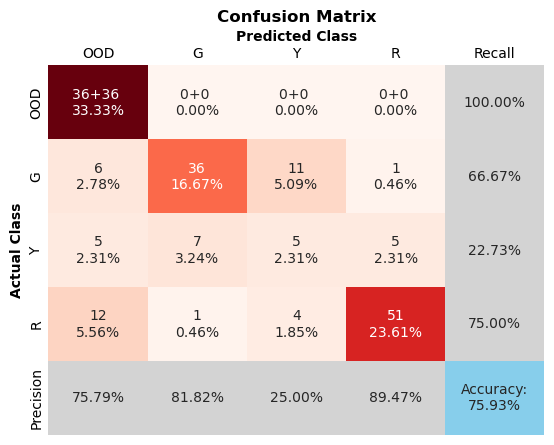

In [26]:
test_MLP = ClassificationComparison(y['test-far-cat'])
name = "MLP+OE_dice"
y_pred = module.predict_with_ood(X['test-far-cat'], detector="dice", threshold_method='roc', **detector_params)
out = extended_confusion_matrix(y['test-far-cat'], y_pred, y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_MLP.calculate_metrics(y_pred, name)

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:07<00:00,  7.37it/s]


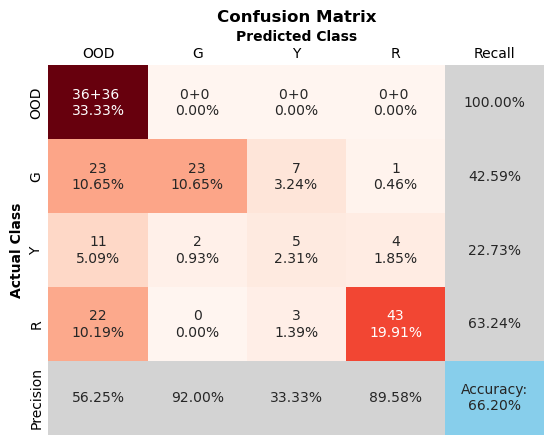

In [27]:
set_random_seed(0)
name = "Paper"
module = MLP(X['train'].shape[1], [1000, 500, 250, 500, 1000], 'relu', 0.0, num_classes)
module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

y_pred = module.predict_with_ood(X['test-far-cat'], detector="MSP", threshold_method = 'percentile')
out = extended_confusion_matrix(y['test-far-cat'], y_pred, y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_MLP.calculate_metrics(y_pred, name)

In [29]:
detector = 'MSP'
score_function = detection_method(detector=detector, model=module, **detector_params)
metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test']), axis=0), missclass_as_ood=False)
metrics_df = pd.DataFrame([metrics], index=['Paper'], columns=columns)
display(metrics_df)

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,Accuracy
Paper,0.034722,0.982639,0.994213,0.967532,0.715278


In [28]:
test_MLP.get_metrics()

,Macro Precision,Macro Recall,Macro F1-Score,Accuracy
Method,,,,
MLP+OE_dice,0.680203,0.660985,0.662766,0.759259
Paper,0.677917,0.571388,0.578482,0.662037


In [50]:
df2.groupby('Y')['Y'].sum()

Y
0      0
1     81
2    462
Name: Y, dtype: int64